# Homework 4

# 1) Does basic house information reflect house's description?

**Scraping and Datasets**

In [10]:
from bs4 import BeautifulSoup
import requests
import time
import pandas as pd
import numpy as np

print ("Start : %s" % time.ctime()) 

url="https://www.immobiliare.it/vendita-case/roma/?criterio=rilevanza="
counturl=1
npages = 600
page = requests.get(url)
soup = BeautifulSoup(page.content, 'html.parser')
titles = []
descriptions = []
prices = []
localss = []
surface = []
baths = []
floor = []
while counturl <= npages:
    housesites = []
    goodurl = url+str(counturl)
    page = requests.get(url)
    soup = BeautifulSoup(page.content, 'html.parser')
    for a in soup.find_all('a', href = True,title = True,id = True): 
        housesites.append(a['href'])
    for a in housesites:
        time.sleep( 0.05 )
        try:
            page = requests.get(a)
            soup = BeautifulSoup(page.content, 'html.parser')
            check = soup.find_all('span',attrs = {'class':'text-bold'})[0].get_text() 
            #print(check)
            if "€" in check:
                a = soup.find_all('h1',attrs = {'class':'raleway title-detail'})[0].get_text()
                b = soup.find_all('div',attrs = {'class':'col-xs-12 description-text text-compressed'})[0].get_text()
                c = soup.find_all('li' ,attrs={'class':'features__price'})[0].get_text()
                d = soup.find_all('span',attrs = {'class':'text-bold'})[1].get_text() 
                e = soup.find_all('span',attrs = {'class':'text-bold'})[2].get_text()
                f = soup.find_all('span',attrs = {'class':'text-bold'})[3].get_text()
                g = soup.find_all('abbr',attrs = {'class':'text-bold im-abbr'})[0].get_text()
                c = c.replace("€","")
                g = g.replace("\n","")
                b = b.replace("\n","")
                g = g.replace("T","0")
                titles.append(a)
                descriptions.append(b)
                prices.append(c)
                localss.append(d)
                surface.append(e)
                baths.append(f)
                floor.append(g)

            else:
                a = soup.find_all('h1',attrs = {'class':'raleway title-detail'})[0].get_text()
                b = soup.find_all('div',attrs = {'class':'col-xs-12 description-text text-compressed'})[0].get_text()
                c = soup.find_all('li' ,attrs={'class':'features__price'})[0].get_text()
                d = soup.find_all('span',attrs = {'class':'text-bold'})[0].get_text() 
                e = soup.find_all('span',attrs = {'class':'text-bold'})[1].get_text()
                f = soup.find_all('span',attrs = {'class':'text-bold'})[2].get_text()
                g = soup.find_all('abbr',attrs = {'class':'text-bold im-abbr'})[0].get_text()
                b = b.replace("\n","")
                c = c.replace("€","")
                g = g.replace("\n","")
                g = g.replace("T","0")
                titles.append(a)
                descriptions.append(b)
                prices.append(c)
                localss.append(d)
                surface.append(e)
                baths.append(f)
                floor.append(g)

        except:
            next
    counturl+=1
        
print ("End : %s" % time.ctime())

Start : Sun Dec  9 21:22:19 2018
End : Mon Dec 10 12:55:58 2018


In [11]:
#transform in DataFrame
data_tuples = list(zip(titles,prices,localss,surface,baths,floor))
df = pd.DataFrame(data_tuples,columns = ["Title","Prices","Locals","Area","Bath","Floor"])
pd.set_option('display.max_colwidth', -1)
df.head()

,Title,Prices,Locals,Area,Bath,Floor
0,"Trilocale via del Padiglione 69, Roma",205.000,3,98,1,R
1,"Trilocale via di Vermicino, Roma",205.000,3,98,1,R
2,"Bilocale via della Fanella 31, Roma",230.000,2,52,1,0
3,"Bilocale viale Marconi, Roma",208.000,2,70,1,6
4,"Attico / Mansarda all'asta via della Marranella, Roma",da 22.650,1,1,51,A


In [12]:
use=df.to_csv('result.csv', index=False)  #save announcements in a csv file

In [13]:
len(df)

13198

Now, we are going to preprocess these 13198 announcements

In [14]:
from stop_words import get_stop_words
import nltk
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer 
from collections import Counter
from collections import defaultdict

In [15]:
words = [] #list with all words from all documents

tfDict = defaultdict(dict)

processedDesc = []
i = 0
for description in descriptions:  
    name = 'announcement'+str(i)
    #we replace the new lines "tags"
    description = description.replace('\\r', ' ')
    description = description.replace('\\n', ' ')
    #tokenize the document, strips out the punctuation
    tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
    tokens_d = tokenizer.tokenize(description)
    #lower case of every word
    tokens_d = [w.lower() for w in tokens_d] 
    #remove stopwords
    stop = set(stopwords.words('italian'))
    tokens_d = [w for w in tokens_d if not w in stop] 
    #stemming
    ps = PorterStemmer()
    tokens_d = [ps.stem(w) for w in tokens_d]
    
    for word in tokens_d: #for every word in the descriptions, put inside a nested dictionary its tf value
        tfDict[name][word] = tokens_d.count(word)/len(tokens_d)
        
    #remove duplicates and append everything to the vocabulary
    tokens_d = set(tokens_d)
        
    i= i+1
    
    print('final')
    print(tokens_d)
    
    for word in tokens_d:
        words.append(word)
        


final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'cucina', 'bolognes', 'maggiori', 'com', 'pagina', '1833', 'posto', 'trova', '914', 'cabina', 'contesto', 'visita', 'terra', 'ampio', 'www', 'salon', 'abitabil', 'camer', 'vitinia', '2', 'proponiamo', 'mezzi', 'maiuranor', 'immobil', 'bagni', 'vendita', 'informazioni', '1226', 'recap', 'ingresso', 'ripostiglio', '392', 'composto', 'pubblici', 'facebook', 'vicino', 'giardino', '3', 'mt', 'contattaci', '333', 'scuol', 'mq', 'soli', 'stazion', 'castel', 'doppio', 'sito', '423', 'appartamento', 'info', 'negozi', 'armadio', 'largo', 'piano', '290', 'zona', 'tranquillo', '140', 'servizi', '200', 'seguenti', 'it'}
final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'cam

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'camera', 'esclusivo', 'torr', 'servizio', 'scelta', 'particolarment', 'tempo', 'ripostiglio', 'complesso', 'ristrutturato', 'residenzial', 'bagno', 'spazi', 'esterni', 'vicino', 'auto', 'vigilanza', 'stesso', 'prettament', 'necessità', 'mq', 'colori', 'pupinia', 'campi', 'prima', 'doppio', 'appartamento', 'inserito', 'armadio', 'organizzati', 'vivac', 'g', 'matrimonial', 'rif', 'completa', 'tranquillo', 'finement', 'ampi', '000', '16'}
final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'cucina', 'bolognes', 'maggiori', 'com', 'pagina', '1833', 'posto', 'trova', '914', 'cabina', 'contesto', 'visita', 'terra', 'ampio', 'www', 'salon', 'abitabil', 'camer', 'vitinia', '2', 'proponiamo', 'mezzi', 'maiuranor', 'immobil', 'bagni', 'vendita', 'informazioni', '1226', 'recap', 'ingresso', 'ripostiglio', '392', 'composto', 'pubblici', 'facebook', 'vicino', 'giardino', '3', 'mt', 'contattaci', '333', 'scuol', 'mq', 'soli', 'stazion', 'castel', 'doppio', 'sito', '423', 'appartamento', 'info', 'negozi', 'armadio', 'largo', 'piano', '290', 'zona', 'tranquillo', '140', 'servizi', '200', 'seguenti', 'it'}
final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'cam

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'camera', 'esclusivo', 'torr', 'servizio', 'scelta', 'particolarment', 'tempo', 'ripostiglio', 'complesso', 'ristrutturato', 'residenzial', 'bagno', 'spazi', 'esterni', 'vicino', 'auto', 'vigilanza', 'stesso', 'prettament', 'necessità', 'mq', 'colori', 'pupinia', 'campi', 'prima', 'doppio', 'appartamento', 'inserito', 'armadio', 'organizzati', 'vivac', 'g', 'matrimonial', 'rif', 'completa', 'tranquillo', 'finement', 'ampi', '000', '16'}
final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', '

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'camera', 'esclusivo', 'torr', 'servizio', 'scelta', 'particolarment', 'tempo', 'ripostiglio', 'complesso', 'ristrutturato', 'residenzial', 'bagno', 'spazi', 'esterni', 'vicino', 'auto', 'vigilanza', 'stesso', 'prettament', 'necessità', 'mq', 'colori', 'pupinia', 'campi', 'prima', 'doppio', 'appartamento', 'inserito', 'armadio', 'organizzati', 'vivac', 'g', 'matrimonial', 'rif', 'completa', 'tranquillo', 'finement', 'ampi', '000', '16'}
final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', '

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', 'total'

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'cucina', 'bolognes', 'maggiori', 'com', 'pagina', '1833', 'posto', 'trova', '914', 'cabina', 'contesto', 'visita', 'terra', 'ampio', 'www', 'salon', 'abitabil', 'camer', 'vitinia', '2', 'proponiamo', 'mezzi', 'maiuranor', 'immobil', 'bagni', 'vendita', 'informazioni', '1226', 'recap', 'ingresso', 'ripostiglio', '392', 'composto', 'pubblici', 'facebook', 'vicino', 'giardino', '3', 'mt', 'contattaci', '333', 'scuol', 'mq', 'soli', 'stazion', 'castel', 'doppio', 'sito', '423', 'appartamento', 'info', 'negozi', 'armadio', 'largo', 'piano', '290', 'zona', 'tranquillo', '140', 'servizi', '200', 'seguenti', 'it'}
final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'cam

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'camera', 'esclusivo', 'torr', 'servizio', 'scelta', 'particolarment', 'tempo', 'ripostiglio', 'complesso', 'ristrutturato', 'residenzial', 'bagno', 'spazi', 'esterni', 'vicino', 'auto', 'vigilanza', 'stesso', 'prettament', 'necessità', 'mq', 'colori', 'pupinia', 'campi', 'prima', 'doppio', 'appartamento', 'inserito', 'armadio', 'organizzati', 'vivac', 'g', 'matrimonial', 'rif', 'completa', 'tranquillo', 'finement', 'ampi', '000', '16'}
final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'cucina', 'bolognes', 'maggiori', 'com', 'pagina', '1833', 'posto', 'trova', '914', 'cabina', 'contesto', 'visita', 'terra', 'ampio', 'www', 'salon', 'abitabil', 'camer', 'vitinia', '2', 'proponiamo', 'mezzi', 'maiuranor', 'immobil', 'bagni', 'vendita', 'informazioni', '1226', 'recap', 'ingresso', 'ripostiglio', '392', 'composto', 'pubblici', 'facebook', 'vicino', 'giardino', '3', 'mt', 'contattaci', '333', 'scuol', 'mq', 'soli', 'stazion', 'castel', 'doppio', 'sito', '423', 'appartamento', 'info', 'negozi', 'armadio', 'largo', 'piano', '290', 'zona', 'tranquillo', '140', 'servizi', '200', 'seguenti', 'it'}
final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'cam

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'cucina', 'esposizion', 'farmacia', 'it', 'balconi', '1p', 'proprietà', 'dotato', 'attività', 'palazzina', 'visita', 'così', 'ampio', 'autonomo', 'f', 'letto', 'salon', 'cantina', 'ottavia', 'riscaldamento', '169', 'camer', 'adiacent', 'ottimo', '2', 'romaimmobiliarecasa', 'luminoso', 'pochi', 'proponiamo', 'disimpegno', 'ottima', 'tutt', 'immobil', 'infissi', 'vendita', 'dona', 'supermercato', 'fm3', 'ascensor', 't', 'legno', 'passi', '95', 'stato', 'composto', 'bagno', 'podestà', 'cortina', '10mq', 'presenta', '06', '97270560', '3', 'banca', 'epgl', 'scomparsa', 'mq', 'ape', 'sito', 'trilocal', 'doppio', 'appartamento', 'commerciali', 'info', 'vista', '1', '5', 'comprensorio', 'piano', 'tripla', 'ca', 'rif', 'completa', 'luminosità', '130', 'condizionatori', 'vetro', '000', 'fermata'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'cucina', 'esposizion', 'farmacia', 'it', 'balconi', '1p', 'proprietà', 'dotato', 'attività', 'palazzina', 'visita', 'così', 'ampio', 'autonomo', 'f', 'letto', 'salon', 'cantina', 'ottavia', 'riscaldamento', '169', 'camer', 'adiacent', 'ottimo', '2', 'romaimmobiliarecasa', 'luminoso', 'pochi', 'proponiamo', 'disimpegno', 'ottima', 'tutt', 'immobil', 'infissi', 'vendita', 'dona', 'supermercato', 'fm3', 'ascensor', 't', 'legno', 'passi', '95', 'stato', 'composto', 'bagno', 'podestà', 'cortina', '10mq', 'presenta', '06', '97270560', '3', 'banca', 'epgl', 'scomparsa', 'mq', 'ape', 'sito', 'trilocal', 'doppio', 'appartamento', 'commerciali', 'info', 'vista', '1', '5', 'comprensorio', 'piano', 'tripla', 'ca', 'rif', 'completa', 'luminosità', '130', 'condizionatori', 'vetro', '000', 'fermata'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'amp

final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'esposizion', 'cucina', 'climatizzatori', 'posto', 'palazzina', 'signoril', 'contesto', 'armadi', 'risulta', 'servizio', 'ingresso', 'bagno', '241', 'spazi', 'luminosissimo', 'composizion', 'riservato', 'altissimo', 'godendo', 'funzional', 'terrazzo', 'elegant', '38', 'camino', 'g', 'splendido', 'immerso', 'appuntamenti', 'primo', 'via', 'interni', '40mq', 'soppalco', 'portineria', 'mqa', 'mano', 'class', 'cancelletti', 'interno', '175', 'immobiliar', 'salon', 'pregio', 'camer', 'port', 'proponiamo', 'ottima', 'immobil', 'molto', 'informazioni', 'massello', 'parquet', 'esser', 'muro', 'd', 'appartamento', 'vetrat', 'manutenzion', 'perini', '870', 'panoramico', 'olgiatella', 'fiorentino', 'co

final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 'cucina', 'esposizion', 'ceramica', 'posto', 'romaimmobiliarecasa', 'bagni', 'ingresso', 'composto', 'bagno', 'divisibil', 'quadrilocal', 'attualment', 'cameretta', 'ape', 'sito', 'g', 'camino', 'strada', 'it', 'unità', 'balconi', 'soppalco', 'diviso', 'dotato', 'silenziosa', 'visita', 'condizioni', 'scoperto', 'salon', 'camer', 'adiacent', 'predisposizion', 'proponiamo', 'immobil', 'infissi', 'vendita', 'giorno', 'parquet', '97270560', 'commercial', 'esser', 'forno', 'appartamento', 'tripla', 'rif', 'ampi', 'p', 'internament', 'nott', 'abitabil', 'matrimoniali', '160', 'buon', 'legno', 'pavimentazion', '06', 'data', 'abit', 'epgl', 'mq', 'vivibili', 'condominial', 'info', 'ampia', 'centro', 'legna', 'tavolo', 'può', 'gattinara'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'amp

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'cucina', 'esposizion', 'farmacia', 'it', 'balconi', '1p', 'proprietà', 'dotato', 'attività', 'palazzina', 'visita', 'così', 'ampio', 'autonomo', 'f', 'letto', 'salon', 'cantina', 'ottavia', 'riscaldamento', '169', 'camer', 'adiacent', 'ottimo', '2', 'romaimmobiliarecasa', 'luminoso', 'pochi', 'proponiamo', 'disimpegno', 'ottima', 'tutt', 'immobil', 'infissi', 'vendita', 'dona', 'supermercato', 'fm3', 'ascensor', 't', 'legno', 'passi', '95', 'stato', 'composto', 'bagno', 'podestà', 'cortina', '10mq', 'presenta', '06', '97270560', '3', 'banca', 'epgl', 'scomparsa', 'mq', 'ape', 'sito', 'trilocal', 'doppio', 'appartamento', 'commerciali', 'info', 'vista', '1', '5', 'comprensorio', 'piano', 'tripla', 'ca', 'rif', 'completa', 'luminosità', '130', 'condizionatori', 'vetro', '000', 'fermata'}
final
{'rifinito', 'box', '60', 'ampio', 'panorama', '2', 'luminoso', 'disimpegno', 'garag', '250', 'metratura', 'presenta', 'auto', 'montespaccato', '4', '5', 'piano', 'ca', 'zona', '000', 'r', 

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'srl', 'box', 'verd', 'altro', 'cabina', 'claudio', '589', 'ottimo', '2', 'pranzo', 'rifinitur', 'ovest', 'ascensor', 'metratura', 'antintrusion', '4', 'energetica', 'distribuzion', 'vista', '328', 'armadio', 'piu', 'piano', 'zona', 'euro', 'vari', '000', 'camilluccia', 'boiseri', 'seguent', 'espos

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'cucina', 'principali', 'terzo', 'posto', 'palazzina', 'condizioni', 'proponiamo', 'ottima', 'camera', 'immobil', 'buon', 'monolocal', 'ingresso', 'composto', 'bagno', '46', 'rispetto', 'presenta', 'intern', 'mq', 'appartamento', 'terrazzo', 'piano', 'posizion', 'servizi'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'v

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'camera', 'esclusivo', 'torr', 'servizio', 'scelta', 'particolarment', 'tempo', 'ripostiglio', 'complesso', 'ristrutturato', 'residenzial', 'bagno', 'spazi', 'esterni', 'vicino', 'auto', 'vigilanza', 'stesso', 'prettament', 'necessità', 'mq', 'colori', 'pupinia', 'campi', 'prima', 'doppio', 'appartamento', 'inserito', 'armadio', 'organizzati', 'vivac', 'g', 'matrimonial', 'rif', 'completa', 'tranquillo', 'finement', 'ampi', '000', '16'}
final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'letto', 'svolg', 'cantina', 'matrimoniali', 'camer', '70mq', 'informazioni', 'prenestina', 'collegato', 'ingresso', 'stato', 'completament', 'divisi', 'reddito', 'angolo', 'affaccio', 'vicino', 'te', 'giardino', 'fiorita', 'soggiorno', 'buono', 'vall', 'grazioso', 'appartamento', 'commerciali', 'piedi', 'negozi', 'centro', 'zona', 'rif', 'raggiungibil', 'tranquillo', '3385052541', 'leoni', 'appuntamenti', 'piani'}
final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'mo

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'via', 'due', 'cucina', 'terrazza', 'soffitto', 'indubbio', 'metri', 'box', 'insiem', 'oggi', 'vacanz', 'corridoio', 'proprietà', 'ben', 'abitativo', 'posto', 'palazzina', 'affaccia', 'roma', 'trova', 'usata', 'ampio', 'conclud', 'interno', 'salon', 'condomminio', 'ensuit', 'riscaldamento', 'camer', 'casa', '2', 'armadi', 'proponiamo', 'pochi', 'interess', 'luminoso', 'rilevatori', 'sciarra', 'lungo', 'ogni', 'immobil', 'bagni', 'camera', 'villa', 'portierato', 'ingresso', 'passi', 'ripostiglio', 'centralizzato', 'composto', 'bagno', 'sud', 'commercial', 'balcon', 'singola', 'muro', 'carini', 'consumo', 'soppalcato', 'doppio', 'esposto', 'gianicolo', 'doppi', '5', 'cinqu', 'elegant', 'quarto', 'piano', 'ricettivo', 'collegata', 'rif', 'punto', 'ampi', 'tre'}
final
{'cucina', 'principali', 'terzo', 'posto', 'palazzina', 'condizioni', 'proponiamo', 'ottima', 'camera', 'immobil', 'buon', 'monolocal', 'ingresso', 'composto', 'bagno', '46', 'rispetto', 'presenta', 'intern', 'mq', 'ap

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'provincial', 'situata', 'istituto', 'comprensivo', 'prender', 'certificati', 'centralizzato', 'metro', 'mese', 'proprio', 'ottimo', 'adriatico', '2', 'luminoso', 'garag', 'condominio', 'ristrutturato', 'presenta', 'affaccio', 'auto', 'stazion', 'energetica', 'maria', '285', 'condominiali', 'montesacro', 'piano', 'zona', 'euro', 'collegata', 'spese', '000', 'cucina', 'due', 'esposizion', '00', 'montessori', 'dotata', 'autobu', 'posto', 'palazzina', '85', 'moto', 'coperto', 'letto', '90', '100', 'prestazion', 'sotto', 'pochi', 'servizio', 'ingresso', 'bagno', 'area', 'vicino', 'conca', 'ape', 'verso', 'comoda', 'servizi', 'situato', 'primo', 'suddiviso', 'principali', 'balconi', 'comprendono', 'abitalità', 'dista', 'affaccia', 'formazion', 'salon', 'attrezzata', 'camer', 'adiacent', 'proponiamo', 'particolar', 'immobil', 'infissi', 'vendita', 'molto', 'portierato', 'minuti', 'contabilizzatori', 'd', 'jonio', 'buono', 'quattro', 'appartamento', 'commerciali', 'professional', 'cosi

final
{'cucina', 'bolognes', 'maggiori', 'com', 'pagina', '1833', 'posto', 'trova', '914', 'cabina', 'contesto', 'visita', 'terra', 'ampio', 'www', 'salon', 'abitabil', 'camer', 'vitinia', '2', 'proponiamo', 'mezzi', 'maiuranor', 'immobil', 'bagni', 'vendita', 'informazioni', '1226', 'recap', 'ingresso', 'ripostiglio', '392', 'composto', 'pubblici', 'facebook', 'vicino', 'giardino', '3', 'mt', 'contattaci', '333', 'scuol', 'mq', 'soli', 'stazion', 'castel', 'doppio', 'sito', '423', 'appartamento', 'info', 'negozi', 'armadio', 'largo', 'piano', '290', 'zona', 'tranquillo', '140', 'servizi', '200', 'seguenti', 'it'}
final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'cam

{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006', 'tota

final
{'cucina', 'due', 'principali', 'balconi', 'posto', 'palazzina', 'condizioni', 'salon', '100', 'matrimoniali', 'camer', 'proponiamo', 'ottima', 'immobil', 'buon', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'rispetto', 'intern', 'presenta', 'mq', 'trilocal', 'appartamento', 'piano', 'ca', 'secondo', 'posizion', 'servizi'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'st

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'superfici', 'linea', 'ampio', 'marmo', 'ottimo', 'ricco', '210', 'ubicazion', 'ristrutturato', 'intern', 'divers', 'scuol', 'rendono', 'università', 't3428', 'est', 'vista', 'adatto', 'livello', 'piano', 'zona', '000', 'cucina', 'due', 'esposizion', 'rend', 'cinecittà', 'terzo', 'ambienti', 'ben', 'palazzina', 'centri', 'esigenz', 'tuscolana', 'casilina', 'pubblico', 'natural', 'svariat', 'cl', 'risultano', 'quadrant', 'soddisfar', 'bagni', 'servizio', 'distanza', 'composto', 'spazi', 'cinecitta', 'negozi', 'breve', 'g', 'comoda', 'straordinariament', 'servita', 'via', 'interni', 'buona', 'finitur', 'mano', 'interessant', 'salon', 'illuminazion', 'distribu', 'camer', 'proponiamo', 'studio', 'palmiro', 'immobil', 'line', 'trilocal', 'appartamento', 'commerciali', 'metropolitana', 'privato', 'rif', 'strategica', 'proprietà', 'nott', 'cantina', 'atac', 'vergata', 'tor', 'stazioni', 'investimento', 'togliatti', 'pavimentazion', 'balcon', 'abit', 'città', 'distant', 'comprensorio', 

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'camera', 'esclusivo', 'torr', 'servizio', 'scelta', 'particolarment', 'tempo', 'ripostiglio', 'complesso', 'ristrutturato', 'residenzial', 'bagno', 'spazi', 'esterni', 'vicino', 'auto', 'vigilanza', 'stesso', 'prettament', 'necessità', 'mq', 'colori', 'pupinia', 'campi', 'prima', 'doppio', 'appartamento', 'inserito', 'armadio', 'organizzati', 'vivac', 'g', 'matrimonial', 'rif', 'completa', 'tranquillo', 'finement', 'ampi', '000', '16'}
final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', '

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contatt

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '6

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '6

final
{'cucina', 'esposizion', 'rovero', 'metri', 'ceramica', 'it', 'soppalco', 'trilo', 'poch', 'dotato', 'palazzina', 'visita', 'condizioni', 'ampio', 'autonomo', '175', 'lucchina', '90', 'ottavia', 'salon', 'abitabil', 'riscaldamento', 'piccola', 'romaimmobiliarecasa', 'proponiamo', 'luminoso', 'disimpegno', 'camera', 'buon', 'vendita', 'immobil', 'fm3', 'infissi', '160', 't', 'legno', 'pavimentazion', 'composto', 'bagno', 'presenta', '97270560', '06', 'commercial', 'balcon', 'doppia', 'gulliv', 'epgl', 'mq', 'cameretta', 'comodo', 'stazion', 'ape', 'sito', 'trilocal', 'appartamento', 'info', 'ampia', '1', 'centro', '5', 'g', 'piano', 'ca', 'matrimonial', 'rif', 'centinaia', '000'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '6

final
{'cucina', 'bolognes', 'maggiori', 'com', 'pagina', '1833', 'posto', 'trova', '914', 'cabina', 'contesto', 'visita', 'terra', 'ampio', 'www', 'salon', 'abitabil', 'camer', 'vitinia', '2', 'proponiamo', 'mezzi', 'maiuranor', 'immobil', 'bagni', 'vendita', 'informazioni', '1226', 'recap', 'ingresso', 'ripostiglio', '392', 'composto', 'pubblici', 'facebook', 'vicino', 'giardino', '3', 'mt', 'contattaci', '333', 'scuol', 'mq', 'soli', 'stazion', 'castel', 'doppio', 'sito', '423', 'appartamento', 'info', 'negozi', 'armadio', 'largo', 'piano', '290', 'zona', 'tranquillo', '140', 'servizi', '200', 'seguenti', 'it'}
final
{'curatissimi', 'via', 'cucina', 'consorzio', 'due', 'rend', '215', 'gaia', 'balconi', 'climatizzato', 'sportivi', 'cromatica', 'distribuiscono', 'insiem', 'proprietà', 'accoglient', 'ambienti', 'ben', 'posto', 'dotato', 'cabina', 'contesto', 'palett', 'servizi', 'letto', 'salon', 'cl', 'distribu', 't2244', 'h24', 'proponiamo', 'termoautonomo', 'circa', '25', '84', 'cam

final
{'superfici', 'altament', 'linea', 'ottimo', 'gode', 'comodità', 'complesso', 'affaccio', 'auto', 'scuol', 'elevato', 'piano', 'zona', 'tre', '000', 'cucina', 'due', 'previsto', 'esposizion', 'trasporto', 'ottimament', 'ambienti', 'ben', 'posto', 'palazzina', 'materiali', 'signoril', 'pubblico', 'impianti', 'natural', '530', 'cl', 'tutt', 'bagni', 'servizio', 'collegato', 'ingresso', 'keplero', 't4256', 'composto', 'spazi', 'performanti', 'recenti', 'negozi', 'residenza', 'standard', 'giovanni', 'banch', 'uffici', 'conferiscono', 'primo', 'via', 'balconi', 'supermercati', 'finitur', 'mano', 'salon', 'pregio', 'distribu', 'camer', 'completano', 'assicurano', 'proponiamo', 'vendita', 'line', 'ristrutturazion', 'residenzial', 'd', 'trilocal', 'appartamento', 'vetrat', 'rotazion', 'organizzati', 'lusso', 'tripla', 'grazi', 'luminosità', 'privilegiata', 'rif', 'ampi', 'portata', 'triplo', 'numeros', 'fascino', 'proprietà', 'cantina', 'abitabil', 'atac', 'cortina', 'serafico', 'enfatiz

final
{'appiano', '100mq', 'via', 'cucina', 'prestigioso', 'portineria', 'fiumicino', 'precisament', 'vicinanza', 'supermercati', 'proprietà', 'metro', 'verd', 'esigenz', 'terra', 'interno', 'immersa', 'ampio', 'presenti', 'letto', 'part', 'cantina', 'oltr', 'disimpegno', 'aereoporto', 'tutt', 'immobil', 'servizio', 'camera', 'tenni', 'ripostiglio', '405mila', 'complesso', 'composto', 'residenzial', 'spazi', 'vendiamo', 'giardino', 'viterbo', 'ostiens', 'scuol', 'eutropio', 'residenti', 'soggiorno', 'stazion', 'interscambio', 'campi', 'sito', 'strategica', 'vall', 'appartamento', 'negozi', 'vista', 'cosi', 'centro', 'richiesta', 'infrastruttur', 'inoltr', 'piano', 'quali', 'bu', '15mq', 'zona', 'palazzo', 'completa', 'aurelia', 'balduina', 'verdi', 'euro', 'necessari', 'strada', 'leggera', 'fermata', 'situato'}
final
{'superfici', 'cucina', 'due', 'ulteriori', 'box', 'arredata', 'gazzebo', 'autobu', 'verd', 'soleggiato', 'centri', 'palazzina', 'grand', 'così', 'veranda', 'cottura', 'le

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'fax', 'terziario', 'colonna', 'box', 'anticipata2_', 'vittoria', 'verd', 'portafogli', 'autonomo', 'ampio', 'contratto', 'depositofidejussion', 'immobiliari', 'consulenza', 'lorda', '2', 'split', 'anno', 'coperta', 'affacci', 'roberto', 'terzi', 'complesso', 'locato', 'intern', 'auto', '05', 'energetica', 'caldaia', 'primario', 'elevato', 'futuro', 'piano', 'livello', 'rete', 'canoni', 'r', 'annuamodalita', 'cucina', 'due', 'milano', 'torino', '85', 'mensilita', '28', 'manutentivo', 'fidejussion', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'pavimenti', 'bagni', '2010', 'società', '35', 'ingresso', '32', 'incarichi', 'gosservatorio', 'attualment', 'nuova', '00193', 'rapporti', 'contrattuali', 'conto', 'pagamento', 'titolo', 'quarto', 'g', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'terrazza', 'modalita', 'impianto', '1_', 'imprenditoriali', 'uso', 'finitur', 'gestion', 'class', '2016', 'immobiliar', 'salon', 'commercializzazioni', 'ca

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'bagni', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'rivestimenti', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', 'consulenza', 'termoautonomo', 'castelverd', 'costi', 'intern', 'ast', 'giardino', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'montepago', 'blindato', 'grate', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', '42', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'terra', 'va', 'immobiliar', 'possesso', 'mutuabili', 'intrusion', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'monolocal', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'privato', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '2006',

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin', 'gre', 'im

final
{'via', 'due', 'cucina', 'terrazza', 'soffitto', 'indubbio', 'metri', 'box', 'insiem', 'oggi', 'vacanz', 'corridoio', 'proprietà', 'ben', 'abitativo', 'posto', 'palazzina', 'affaccia', 'roma', 'trova', 'usata', 'ampio', 'conclud', 'interno', 'salon', 'condomminio', 'ensuit', 'riscaldamento', 'camer', 'casa', '2', 'armadi', 'proponiamo', 'pochi', 'interess', 'luminoso', 'rilevatori', 'sciarra', 'lungo', 'ogni', 'immobil', 'bagni', 'camera', 'villa', 'portierato', 'ingresso', 'passi', 'ripostiglio', 'centralizzato', 'composto', 'bagno', 'sud', 'commercial', 'balcon', 'singola', 'muro', 'carini', 'consumo', 'soppalcato', 'doppio', 'esposto', 'gianicolo', 'doppi', '5', 'cinqu', 'elegant', 'quarto', 'piano', 'ricettivo', 'collegata', 'rif', 'punto', 'ampi', 'tre'}
final
{'cucina', 'principali', 'terzo', 'posto', 'palazzina', 'condizioni', 'proponiamo', 'ottima', 'camera', 'immobil', 'buon', 'monolocal', 'ingresso', 'composto', 'bagno', '46', 'rispetto', 'presenta', 'intern', 'mq', 'ap

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'fax', 'terziario', 'colonna', 'box', 'anticipata2_', 'vittoria', 'verd', 'portafogli', 'autonomo', 'ampio', 'contratto', 'depositofidejussion', 'immobiliari', 'consulenza', 'lorda', '2', 'split', 'anno', 'coperta', 'affacci', 'roberto', 'terzi', 'complesso', 'locato', 'intern', 'auto', '05', 'energetica', 'caldaia', 'primario', 'elevato', 'futuro', 'piano', 'livello', 'rete', 'canoni', 'r', 'annuamodalita', 'cucina', 'due', 'milano', 'torino', '85', 'mensilita', '28', 'manutentivo', 'fidejussion', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'pavimenti', 'bagni', '2010', 'società', '35', 'ingresso', '32', 'incarichi', 'gosservatorio', 'attualment', 'nuova', '00193', 'rapporti', 'contrattuali', 'conto', 'pagamento', 'titolo', 'quarto', 'g', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'terrazza', 'modalita', 'impianto', '1_', 'imprenditoriali', 'uso', 'finitur', 'gestion', 'class', '2016', 'immobiliar', 'salon', 'commercializzazioni', 'ca

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'fax', 'terziario', 'colonna', 'box', 'anticipata2_', 'vittoria', 'verd', 'portafogli', 'autonomo', 'ampio', 'contratto', 'depositofidejussion', 'immobiliari', 'consulenza', 'lorda', '2', 'split', 'anno', 'coperta', 'affacci', 'roberto', 'terzi', 'complesso', 'locato', 'intern', 'auto', '05', 'energetica', 'caldaia', 'primario', 'elevato', 'futuro', 'piano', 'livello', 'rete', 'canoni', 'r', 'annuamodalita', 'cucina', 'due', 'milano', 'torino', '85', 'mensilita', '28', 'manutentivo', 'fidejussion', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'pavimenti', 'bagni', '2010', 'società', '35', 'ingresso', '32', 'incarichi', 'gosservatorio', 'attualment', 'nuova', '00193', 'rapporti', 'contrattuali', 'conto', 'pagamento', 'titolo', 'quarto', 'g', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'terrazza', 'modalita', 'impianto', '1_', 'imprenditoriali', 'uso', 'finitur', 'gestion', 'class', '2016', 'immobiliar', 'salon', 'commercializzazioni', 'ca

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'terziario', 'colonna', 'arredata', 'vittoria', 'portafogli', '00osservatorio', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', 'piazzal', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '68192852la', 'miglior', 'luce', 'front', 'quartier', 'vista', 'primario', '750', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', 'milano', 'corredata', 'torino', 'roma', 'nuovi', 'color', 'fidejussion', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'romala', 'società', 'incarichi', 'bagno', 'completament', 'attualment', 'soggiorno', 'scender', 'rapporti', 'elettrico', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', 'illuminantiserramenti', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', '68192837fax', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 're

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'terziario', 'fax', 'colonna', 'arredata', 'vittoria', 'portafogli', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', '2', 'piazzal', '008', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '4', 'miglior', 'luce', 'front', 'quartier', '2018', 'vista', 'primario', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', '00', 'milano', 'corredata', '700', 'torino', 'roma', 'nuovi', 'color', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'depos', 'società', '32', 'serramenti', 'bagno', 'completament', 'incarichi', 'attualment', 'soggiorno', 'scender', '00193', 'elettrico', 'rapporti', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 'residenzial', 'speciali

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin', 'gre', 'im

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'bagni', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'rivestimenti', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin

final
{'annuncio', 'box', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'disimpegno', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'clima', 'tramit', 'francesco', 'riferisc', '5', 'piano', 'oneri', 'aggiudicabili', 'valutazion', '000', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'palazzina', 'roma', 'coperto', '90', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'blindato', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'gratuita', 'offerta', 'servizi', 'piani', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', '150', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'vitalini', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'mi

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', 'disimpegno', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '90', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'salon', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', '624', 'torraccio', 'immobil', 'presentar', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'torrenova', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'merc

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin', 'gre', 'im

final
{'casaletto', 'european', '60', 'sottoscala', 'cottura', 'oltr', 'attacco', 'camera', 'condomini', 'condominio', 'passi', 'complesso', 'auto', 'giardino', 'fra', '45', 'ultima', 'vall', 'energetica', 'vista', 'armadio', 'ripartito', 'zona', 'spese', 'circoli', 'due', 'pannelli', 'prima', 'tutta', 'posto', 'tetto', 'coperto', 'letto', 'completo', 'vasca', 'generazion', 'dispon', 'proprieta', 'scelta', 'nicola', 'bagno', 'composizion', 'vendiamo', 'cioè', 'vicino', 'trasformazion', 'quindi', 'grazioso', 'recent', 'negozi', 'nuov', 'standard', 'immerso', 'servizi', 'banch', 'salotto', 'offr', 'via', 'mail', 'sportivi', 'supermercati', 'lavatric', 'dotato', 'chiamar', 'class', 'casa', 'casediromaluxuri', 'costruzion', 'equament', 'mandar', 'parquet', 'residenzial', 'solari', 'ex', 'casali', 'muro', 'appartamento', 'recentissima', 'quali', 'sig', 'com', 'congruo', 'proprietà', '2011', 'lavanderia', 'grand', 'qualsiasi', 'pavimentato', 'riscaldamento', 'vano', 'affogalasino', 'convento

final
{'via', 'due', 'cucina', 'metri', 'terrazza', '337274608', 'diventar', 'caroli', 'potrebb', 'proprietà', 'grand', 'signoril', 'cabina', '730', 'nott', 'letto', 'salon', 'abitabil', 'camer', '0689130233', 'armadi', 'bel', '3935083056', 'balconcino', '3935068250', 'disimpegno', 'tel', 'pranzo', 'camera', 'bagni', 'servizio', 'garag', 'ascensor', 'ugo', 'ingresso', 'ristrutturato', 'quadrati', 'completament', 'composto', 'terza', 'bagno', '190', 'balcon', 'muro', 'seminterrato', 'fra', 'volendo', 'doppio', 'esposto', 'appartamento', 'terrazzo', 'sala', 'de', 'pagamento', 'cell', 'armadio', 'mezzogiorno', 'padronal', 'livello', 'piano', 'secondo', 'zona', '40', 'palazzo', 'soffitta', 'vari', '000'}
final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'du

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'annuncio', '500', 'ricerca', 'corridoio', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'tramit', '5', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'roma', '100', 'asta', 'appuntamento', '187', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'marconi', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'gubbio', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', 'total', 'chiavi', 'oderisi', 'mercato'

final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazzato', 'finestra', 'videosorvegliato', 'enea', 'via', 'fino', 'nb', 'terra', 'visionar', 'salon', 'italia', 'camer', 'vermicino', 'predisposizion', 'particolar', 'bticino', 'immobil', 'molto', 'vendita', 'accessoriato', 'attenzion', 'd', 'trilocal', 'acquisto', 'appartamento', 'videocitofono', 'urbanistich', 'assistenza', 'immobili', 'precisament', 'regola', 'grand', 'notaril', 'padiglion', 'prezzo', 'condizionata', 'ripostiglio', '205', 'cortina', 'trattativa', 'aria', 'mq', 'numero', 'contattateci', '36617122

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'terziario', 'fax', 'colonna', 'arredata', 'vittoria', 'portafogli', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', '2', 'piazzal', '008', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '4', 'miglior', 'luce', 'front', 'quartier', '2018', 'vista', 'primario', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', '00', 'milano', 'corredata', '700', 'torino', 'roma', 'nuovi', 'color', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'depos', 'società', '32', 'serramenti', 'bagno', 'completament', 'incarichi', 'attualment', 'soggiorno', 'scender', '00193', 'elettrico', 'rapporti', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 'residenzial', 'speciali

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin', 'gre', 'im

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', 'arta', '15', 'fase', '60', 'consulenza', '2', 'pranzo', 'costi', 'intern', 'auto', 'ast', 'esclusiva', 'legal', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'posto', 'roma', 'term', '100', 'asta', 'appuntamento', 'tutt', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'terrazzo', 'prenotazion', 'labaro', 'gratuita', 'offerta', 'servizi', 'procedur', 'offr', 'via', 'nulla', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', '625', 'acquisto', 'appartamento', 'sesto', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini', 'consegna', '155', '

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'bagni', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'rivestimenti', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'terziario', 'colonna', 'arredata', 'vittoria', 'portafogli', '00osservatorio', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', 'piazzal', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '68192852la', 'miglior', 'luce', 'front', 'quartier', 'vista', 'primario', '750', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', 'milano', 'corredata', 'torino', 'roma', 'nuovi', 'color', 'fidejussion', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'romala', 'società', 'incarichi', 'bagno', 'completament', 'attualment', 'soggiorno', 'scender', 'rapporti', 'elettrico', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', 'illuminantiserramenti', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', '68192837fax', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 're

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'via', 'principali', 'space', 'soluzion', 'open', 'uso', 'dotato', 'posto', 'terra', 'interno', 'entrata', 'cottura', 'ottimo', 'proponiamo', 'pochi', 'risulta', 'ottima', 'immobil', 'camera', 'vendita', 'investimento', 'monolocal', 'alessandrino', 'ingresso', 'passi', 'porta', 'ristrutturato', 'central', 'composto', 'bagno', 'stato', 'presenta', 'angolo', 'completament', 'esser', 'indipendent', 'condizionator', 'quartier', 'soggiorno', 'blindata', 'appartamento', 'campoin', 'piano', 'matrimonial', 'tinta', 'stabil', 'posizion', 'soppalcata', 'servizi'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso

final
{'annuncio', 'montelapiano', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'consulenza', '2', 'termoautonomo', 'pranzo', 'costi', 'intern', 'ast', 'esclusiva', 'legal', '124', 'clima', 'condominiali', 'tramit', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'palazzina', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'domanda', 'contattaci', 'dovuto', 'soggiorno', 'prenotazion', 'prenestino', 'gratuita', 'offerta', 'servizi', 'piani', 'primo', 'procedur', 'offr', 'via', 'nulla', 'balconi', 'onorario', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'camer', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'appartamento', 'rimborsi', 'provincia', 'client', 'minima', 'offriamo', 'assiste

final
{'annuncio', 'ricerca', 'acquistabili', 'acquisibili', '60', '15', 'fase', 'ampio', '22', 'consulenza', 'termoautonomo', 'disimpegno', 'camera', 'costi', 'intern', 'ast', 'esclusiva', 'legal', 'ristrutturar', 'tramit', '650', 'riferisc', 'piano', 'oneri', 'aggiudicabili', 'valutazion', 'rappresentant', 'rappresentanza', 'cucina', 'intera', 'prima', 'sicurezza', 'torpignattara', 'roma', '100', 'asta', 'appuntamento', 'tutt', 'ingresso', 'composto', 'bagno', 'domanda', 'contattaci', 'dovuto', 'terrazzo', 'prenotazion', 'gratuita', 'offerta', 'procedur', 'offr', 'via', 'nulla', 'onorario', '6', 'documentazion', 'va', 'immobiliar', 'possesso', 'mutuabili', 'valor', 'predisposizion', 'studio', 'redazion', 'immission', 'caso', 'presentar', 'immobil', 'vendita', 'attico', 'giorno', 'informativo', 'visit', 'commercial', 'giudiziaria', 'partecipazion', 'fasi', 'acquisto', 'rimborsi', 'provincia', 'client', 'marranella', 'minima', 'offriamo', 'assistenza', 'immobili', 'totalment', 'termini

final
{'offr', 'cucina', 'via', 'supermercati', 'corridoio', 'vicinanza', 'metro', '6', 'marconi', 'roma', '208', 'post', 'proponiamo', 'paolo', 'risulta', 'ottima', 'lungo', 'camera', 'immobil', 'vendita', 'fermat', 'b', 'saloncino', 'ingresso', 'ripostiglio', 'composto', 'bagno', 'pubblici', 'sedi', 'data', 'esser', 'balcon', 'scuol', 'quartier', 'università', 'funzional', 'esposto', 'appartamento', 'commerciali', 'san', 'finestra', 'piano', 'hargo', 'stretta', 'posizion', 'studi', 'servizi', 'tre', '000'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso', 'composto', 'bagno', 'vigenti', 'banca', 'terrazza

final
{'fax', 'terziario', 'colonna', 'box', 'anticipata2_', 'vittoria', 'verd', 'portafogli', 'autonomo', 'ampio', 'contratto', 'depositofidejussion', 'immobiliari', 'consulenza', 'lorda', '2', 'split', 'anno', 'coperta', 'affacci', 'roberto', 'terzi', 'complesso', 'locato', 'intern', 'auto', '05', 'energetica', 'caldaia', 'primario', 'elevato', 'futuro', 'piano', 'livello', 'rete', 'canoni', 'r', 'annuamodalita', 'cucina', 'due', 'milano', 'torino', '85', 'mensilita', '28', 'manutentivo', 'fidejussion', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'pavimenti', 'bagni', '2010', 'società', '35', 'ingresso', '32', 'incarichi', 'gosservatorio', 'attualment', 'nuova', '00193', 'rapporti', 'contrattuali', 'conto', 'pagamento', 'titolo', 'quarto', 'g', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'terrazza', 'modalita', 'impianto', '1_', 'imprenditoriali', 'uso', 'finitur', 'gestion', 'class', '2016', 'immobiliar', 'salon', 'commercializzazioni', 'ca

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'via', 'principali', 'space', 'soluzion', 'open', 'uso', 'dotato', 'posto', 'terra', 'interno', 'entrata', 'cottura', 'ottimo', 'proponiamo', 'pochi', 'risulta', 'ottima', 'immobil', 'camera', 'vendita', 'investimento', 'monolocal', 'alessandrino', 'ingresso', 'passi', 'porta', 'ristrutturato', 'central', 'composto', 'bagno', 'stato', 'presenta', 'angolo', 'completament', 'esser', 'indipendent', 'condizionator', 'quartier', 'soggiorno', 'blindata', 'appartamento', 'campoin', 'piano', 'matrimonial', 'tinta', 'stabil', 'posizion', 'soppalcata', 'servizi'}
final
{'rifinito', 'comprensivo', 'percorso', 'metro', '60', 'ampio', '2', 'rogito', 'termoautonomo', 'elettrich', 'garag', 'ascensor', 'videosorvegliata', 'auto', 'nuovo', 'giardino', 'esclusiva', 'antifurto', 'colori', 'seguira', 'vista', 'catastali', 'piu', 'piano', 'ca', '000', 'cucina', 'serrand', '69', 'ben', 'torvergata', 'palazzina', '85', 'posto', 'norm', 'impianti', 'h24', 'cura', 'durant', 'tutt', 'servizio', 'ingresso

final
{'fax', 'terziario', 'colonna', 'box', 'anticipata2_', 'vittoria', 'verd', 'portafogli', 'autonomo', 'ampio', 'contratto', 'depositofidejussion', 'immobiliari', 'consulenza', 'lorda', '2', 'split', 'anno', 'coperta', 'affacci', 'roberto', 'terzi', 'complesso', 'locato', 'intern', 'auto', '05', 'energetica', 'caldaia', 'primario', 'elevato', 'futuro', 'piano', 'livello', 'rete', 'canoni', 'r', 'annuamodalita', 'cucina', 'due', 'milano', 'torino', '85', 'mensilita', '28', 'manutentivo', 'fidejussion', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'pavimenti', 'bagni', '2010', 'società', '35', 'ingresso', '32', 'incarichi', 'gosservatorio', 'attualment', 'nuova', '00193', 'rapporti', 'contrattuali', 'conto', 'pagamento', 'titolo', 'quarto', 'g', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'terrazza', 'modalita', 'impianto', '1_', 'imprenditoriali', 'uso', 'finitur', 'gestion', 'class', '2016', 'immobiliar', 'salon', 'commercializzazioni', 'ca

final
{'via', 'cucina', 'esposizion', 'portineria', 'sestio', 'metro', 'dotato', 'ben', 'posto', 'tuscolana', 'così', 'ampio', 'interno', 'letto', 'abitabil', 'proponiamo', 'gode', 'mezzi', 'ottima', 'cominio', 'servizio', 'vendita', 'camera', 'accesso', 'immobil', 'ascensor', 'ingresso', 'composto', 'bagno', 'finestrato', 'stato', 'presenta', 'ponzio', 'balcon', 'doppia', 'giardino', 'lucio', 'quinto', 'sett', 'soggiorno', 'buono', 'condominial', 'appartamento', 'vicinanz', 'immedi', 'piano', 'matrimonial', 'zona', 'servita', 'stabil', 'grazi', 'luminosità', 'servizi', 'piani', 'fermata'}
final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'c

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'soluzion', 'pizzeri', '4km', '7e', 'bonaventura', '558', 'rispetta', 'metro', 'c9', 'completava', 'infanzia', 'farmaci', 'venezia', 'ampio', 'superconti', 'ottimo', 'centocel', 'gode', 'mezzi', 'disimpegno', 'chies', 'mundi', 'camera', 'direttament', 'ascensor', 'servito', 'passi', 'tend', 'complesso', '106', 'divers', 'affaccio', 'arredo', 'scuol', '7', 'riservata', 'n18', 'bar', 'est', 'ristoranti', 'armadio', 'medi', 'destinazion', 'parco', 'matrimonial', 'zona', 'romanisti', 'fermata', 'r', 'cucina', 'esposizion', '00', 'poiché', 'cinecittà', 'aperti', 'spaccata', 'dotata', 'autobu', 'ben', 'palazzina', 'casilina', 'tuscolana', 'terrazzino', 'posta', 'h24', 'pochi', '313', 'prenestina', 'medico', 'suddetto', 'numerosi', 'ingresso', 'composto', 'bagno', 'biblioteca', 'attualment', 'emm', 'rocca', 'regina', 'cald', 'semi', 'finestra', 'ritrovi', 'ragazzi', 'negozi', 'grott', 'inoltr', 'g', 'servizi', 'locali', 's', 'piani', 'via', 'fino', '8', 'supermercati', 'uso', 'dotato',

final
{'seconda', 'via', 'cucina', 'interni', 'circolar', 'question', 'bilocal', 'corridoio', 'metro', 'posto', 'esposizionecentocel', 'signoril', 'piazza', 'comodi', 'interno', 'possibilità', 'letto', 'accessibil', 'salon', 'acced', 'abitabil', 'adiacent', 'proponiamo', 'luminoso', 'circa', 'gode', 'balconcino', 'delpino', 'ricavar', 'tram', 'camera', 'servizio', 'vendita', 'immobil', 'attico', '19', 'ingresso', 'ripostiglio', 'metratura', 'ristrutturato', 'composto', 'bagno', '70', 'federico', 'spazi', 'presenta', 'stato', 'data', 'indipendent', '4', 'mq', 'soggiorno', 'invec', 'nuova', 'buono', 'stazion', 'grazioso', 'silenzioso', 'terrazzo', 'appartamento', 'gardeni', 'ampia', '5', 'quarto', 'piano', 'tripla', 'secondo', 'zona', 'stabil', 'piani', 'fermata'}
final
{'via', 'esposizion', 'cucina', '8', 'autonoma', 'balconi', 'proprietà', 'elemento', 'class', 'proprio', 'ampio', 'presenti', '175', 'ze', 'pasqual', 'nobilior', 'fulvio', 'letto', 'abitabil', 'camer', 'cantina', 'prestaz

final
{'fin', 'due', 'soluzion', 'pronta', 'asellio', 'metro', '60', 'ricca', 'posto', 'trova', 'attività', 'piazza', 'contesto', 'interno', 'letto', 'entrambi', 'acced', 'subito', 'comunicant', 'camer', 'vivibil', 'ottimo', 'cerca', 'pochi', 'visto', 'immobil', 'silenziosi', 'appaucina', 'affacci', 'minuti', 'ingresso', 'ripostiglio', 'tempo', 'ristrutturato', 'composto', 'completament', 'stato', 'cortina', 'esser', 'balcon', 'inrtamento', 'stesso', 'anni', 'soggiorno', 'appartamento', 'agricola', 'sempronio', 'doppi', 'piedi', 'finestra', 'studiolo', 'commerciali', 'adatto', 'piano', 'secondo', 'zona', 'stabil', 'tranquillo', 'abitata', 'giulio', 'servizi', 'ampi', 'fermata'}
final
{'via', 'lati', 'cucina', 'metri', '337274608', 'facilment', 'luca', 'terzo', 'utilizzato', '000', 'posto', 'signoril', 'piazza', 'condizioni', 'epoca', 'cortil', 'cantina', 'cardin', 'abitabil', 'camer', '0689130233', '2', 'salotto', 'proponiamo', 'luminoso', '151', 'studio', '3935068250', '3935083056', '

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'via', 'cucina', 'portineria', 'certificati', 'poca', 'sestio', '60', 'dotato', 'dotata', 'metro', 'tuscolana', 'nuovi', 'impianti', 'letto', 'abitabil', 'pochi', 'camera', 'servizio', 'accesso', 'infissi', 'ascensor', 'ingresso', 'passi', 'ripostiglio', 'parquet', 'ristrutturato', 'composto', 'bagno', 'finestrato', 'completament', 'distanza', 'balcon', 'condizionator', 'giardino', 'calpurnio', 'fiamma', 'anni', 'lucio', 'soggiorno', 'condominial', 'appartamento', 'ampia', 'stabil', 'servizi', 'strada', 'fermata'}
final
{'cucina', 'esposizion', 'principali', 'bilocal', 'metro', 'dotato', 'posto', 'servizi', 'salon', 'abitabil', 'totali', 'proponiamo', 'pochi', 'gode', 'disimpegno', 'ottima', 'camera', 'immobil', 'vendita', 'ascensor', 'alessandrino', 'ingresso', 'passi', 'ripostiglio', 'composto', 'bagno', 'stato', 'presenta', 'affaccio', 'balcon', 'doppia', 'alessandrinoa', 'quattro', 'original', 'libero', 'appartamento', 'finestra', 'piano', 'secondo', 'tinta', 'stabil', 'matr

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'bagni', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'rivestimenti', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'conto', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'primo', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'portineria', 'gestion', 'interno', 'immobiliar', 'f', 'commercializzazioni', 'camer', 'studio', 'tel', 'residenzial', 'specialistica', 'commercial', 'appartamento', 'commerciali', 'vanta', 'rif', 'costituita', 'ampi', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', '2019', 'intermediazion', 'osservatorio', 'investimento', 'restaurar', '68192852', 'prestando', 'ripostiglio', '003', 'importanti', '06', 'v', 'mtcompletament', '3', '68192837', 'conduzion'}
final
{

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'via', 'due', 'cucina', 'principali', 'esposizion', 'alendatraversa', 'soluzion', 'balconi', 'bilocal', 'giardinetti', 'metro', 'dotata', 'aperto', 'modificata', 'posto', 'palazzina', 'casilina', 'ampio', 'salon', 'abitabil', 'totali', 'proponiamo', 'pochi', 'luminoso', 'gode', 'disimpegno', 'camera', 'immobil', 'vendita', 'molto', 'ascensor', 'ingresso', 'passi', 'angolar', 'composto', 'bagno', 'presenta', 'cortina', 'affaccio', 'esser', 'doppia', 'attualment', 'trilocal', 'vicinanz', 'ristrutturar', 'piano', 'matrimonial', 'presta', 'grazi', 'servizi', 'piani', 'fermata', 'primo'}
final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 'miglior', 'primario', 'altezz', 'piano', 'rete', 'r', 'cucina', 'due', '00', 'milano', 'torino', 'roma', 'cortil', 'consolidata', 'sviluppo', 'servizio', 'società', 'ingresso', '32', 'incarichi', 'attualment', '00193', 'rapporti', 'c

final
{'al0525', 'via', 'cucina', 'esposizion', 'trasporto', 'ammontano', '00', 'scasso', 'centralizzato', 'proprietà', '60', 'ben', 'posto', 'palazzina', 'veranda', 'portoncino', 'ampio', 'autonomo', '175', 'www', 'comclass', 'cantina', 'riscaldamento', 'amelia', 'abitabil', 'camer', 'matrimoniali', 'port', 'proponiamo', 'luminoso', 'ipe', 'mezzi', '0677250085', 'tel', 'immobil', 'infissi', 'vendita', 'villa', 'molto', 'valvol', 'acqua', 'mensili', '419', 'legno', 'ingresso', 'ripostiglio', 'calda', 'composto', 'blindato', 'balcon', 'doppia', 'servita', '120', 'mq', 'soggiorno', 'lai', 'doppio', 'poco', '3891944975', 'appartamento', 'doppi', 'condominiali', 'ristrutturata', 'commerciali', 'cell', '1', 'richiesta', 'gruppomd', 'cieco', 'g', 'piano', 'termo', 'alluminio', 'rif', 'completa', '1950', 'spese', 'euro', 'servizi', 'vetro', 'zona', 'anti', 'tre', '000'}
final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori',

final
{'terziario', 'colonna', 'arredata', 'vittoria', 'portafogli', '00osservatorio', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', 'piazzal', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '68192852la', 'miglior', 'luce', 'front', 'quartier', 'vista', 'primario', '750', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', 'milano', 'corredata', 'torino', 'roma', 'nuovi', 'color', 'fidejussion', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'romala', 'società', 'incarichi', 'bagno', 'completament', 'attualment', 'soggiorno', 'scender', 'rapporti', 'elettrico', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', 'illuminantiserramenti', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', '68192837fax', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 're

final
{'via', 'due', 'cucina', 'metri', 'terrazza', '337274608', 'diventar', 'caroli', 'potrebb', 'proprietà', 'grand', 'signoril', 'cabina', '730', 'nott', 'letto', 'salon', 'abitabil', 'camer', '0689130233', 'armadi', 'bel', '3935083056', 'balconcino', '3935068250', 'disimpegno', 'tel', 'pranzo', 'camera', 'bagni', 'servizio', 'garag', 'ascensor', 'ugo', 'ingresso', 'ristrutturato', 'quadrati', 'completament', 'composto', 'terza', 'bagno', '190', 'balcon', 'muro', 'seminterrato', 'fra', 'volendo', 'doppio', 'esposto', 'appartamento', 'terrazzo', 'sala', 'de', 'pagamento', 'cell', 'armadio', 'mezzogiorno', 'padronal', 'livello', 'piano', 'secondo', 'zona', '40', 'palazzo', 'soffitta', 'vari', '000'}
final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina',

final
{'terziario', 'colonna', 'arredata', 'vittoria', 'portafogli', '00osservatorio', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', 'piazzal', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '68192852la', 'miglior', 'luce', 'front', 'quartier', 'vista', 'primario', '750', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', 'milano', 'corredata', 'torino', 'roma', 'nuovi', 'color', 'fidejussion', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'romala', 'società', 'incarichi', 'bagno', 'completament', 'attualment', 'soggiorno', 'scender', 'rapporti', 'elettrico', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', 'illuminantiserramenti', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', '68192837fax', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 're

final
{'cucina', 'esposizion', 'principali', 'bilocal', 'metro', 'dotato', 'posto', 'servizi', 'salon', 'abitabil', 'totali', 'proponiamo', 'pochi', 'gode', 'disimpegno', 'ottima', 'camera', 'immobil', 'vendita', 'ascensor', 'alessandrino', 'ingresso', 'passi', 'ripostiglio', 'composto', 'bagno', 'stato', 'presenta', 'affaccio', 'balcon', 'doppia', 'alessandrinoa', 'quattro', 'original', 'libero', 'appartamento', 'finestra', 'piano', 'secondo', 'tinta', 'stabil', 'matrimonial', 'luminosità', 'grazi', 'quartier', 'piani', 'fermata'}
final
{'cort', 'coppia', 'metri', 'soffitti', 'soppalco', 'bilocal', 'box', 'uso', 'dotato', 'posto', 'terra', 'cancelletti', 'cottura', 'salon', 'vivibil', 'ottimo', 'proponiamo', 'giovan', 'disimpegno', 'mattonata', 'camera', 'immobil', 'vendita', 'torr', 'investimento', 'sfruttabili', 'ingresso', 'ripostiglio', 'porta', 'ristrutturato', 'composto', 'bagno', 'completament', 'angolo', 'indipendent', 'condizionator', 'quasi', 'esclusiva', '4', 'doccia', 'bli

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'rifinito', 'collegamento', 'metro', 'linea', 'proprio', 'ampio', 'circa', 'gode', 'permettono', 'periferich', 'ascensor', 'palestr', 'metronia', 'propietà', 'passi', 'circondano', 'ristrutturato', 'pubblici', 'presenta', 'esclusiva', 'attraverso', 'soli', 'bar', 'vetulonia', 'armadio', '5', 'piano', 'zona', 'tre', 'fermata', 'cucina', 'due', 'pvc', 'ammirar', 'bellezz', 'autobu', 'ambienti', 'posto', 'palazzina', 'possibil', 'roma', 'letto', 'ripostigli', 'notevoli', 'passeggiata', 'pochi', 'tutt', 'bagni', 'fermat', 'ingresso', 'restant', 'composto', 'epiro', 'contrattual', 'esposizioni', 'nuova', 'alto', 'passaggi', 'condurrà', 'san', 'negozi', 'servita', 'giovanni', 'eterna', 're', 'piani', 'unità', 'via', 'soppalco', 'supermercati', 'attività', 'navicella', 'piazza', 'pressi', 'immobiliar', 'salon', 'cuor', 'camer', 'proponiamo', 'immobil', 'infissi', 'vendita', 'potret', 'informazioni', 'parchi', 'minuti', 'porta', 'parquet', 'central', 'zama', 'muro', 'd', 'urb', 'titolar

final
{'bathroom', 'cucina', 'esposizion', 'due', 'sale', 'eur', 'box', 'bedroom', 'verd', 'signoril', 'delay', 'ampio', 'servizi', 'salon', '497ref', 'abitabil', 'fine', 'camer', 'armadi', 'exposur', 'entranc', 'luminoso', 'district', 'terrazzi', 'doubl', 'wardrob', 'terrac', 'tel', 'esclusivo', 'vendita', 'hall', 'the', 'ingresso', 'apart', 'for', 'ristrutturato', 'kitchen', '06', '43', 'exclus', 'three', 'muro', '53', 'renov', 'dilazioni', 'doppio', 'green', 'two', 'appartamento', 'doppi', '497', 'comprensorio', '1080m', 'tripla', 'rif', 'larg', 'finement', 'bright', 'tre', 'tripl', 'permut'}
final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona'

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'bagni', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'rivestimenti', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin

final
{'via', 'cucina', 'clientela', 'principali', 'internament', 'fino', 'assunzion', 'pepe', 'terzo', 'metro', 'ben', 'posto', 'grand', '6', 'signoril', 'contesto', 'visita', 'visionar', 'ampio', 'piazza', 'battistini', 'roma', 'immobiliar', 'salon', 'letto', 'completo', 'abitabil', 'definitivo', 'offrendo', 'appuntamenti', 'luminoso', 'cura', 'trasparenza', 'particolar', 'immobil', 'camera', 'vendita', 'vien', 'propria', 'inizio', 'prenotar', 'massima', 'composto', 'mida', '70', 'bagno', 'atto', '06', '52721265', 'balcon', 'compravendita', 'contattaci', 'doccia', 'ceduto', 'mq', 'attenzion', 'ardea', 'distant', 'poco', 'chiamando', 'appartamento', 'troviamo', 'semi', 'panoramicissimo', 'puoi', 'rapporto', 'piano', 'propon', 'zona', 'collegata', 'arredamento', 'stipula', 'sevizio', 'servizi', 'assistenza', 'fermata'}
final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 

final
{'al0525', 'via', 'cucina', 'esposizion', 'trasporto', 'ammontano', '00', 'scasso', 'centralizzato', 'proprietà', '60', 'ben', 'posto', 'palazzina', 'veranda', 'portoncino', 'ampio', 'autonomo', '175', 'www', 'comclass', 'cantina', 'riscaldamento', 'amelia', 'abitabil', 'camer', 'matrimoniali', 'port', 'proponiamo', 'luminoso', 'ipe', 'mezzi', '0677250085', 'tel', 'immobil', 'infissi', 'vendita', 'villa', 'molto', 'valvol', 'acqua', 'mensili', '419', 'legno', 'ingresso', 'ripostiglio', 'calda', 'composto', 'blindato', 'balcon', 'doppia', 'servita', '120', 'mq', 'soggiorno', 'lai', 'doppio', 'poco', '3891944975', 'appartamento', 'doppi', 'condominiali', 'ristrutturata', 'commerciali', 'cell', '1', 'richiesta', 'gruppomd', 'cieco', 'g', 'piano', 'termo', 'alluminio', 'rif', 'completa', '1950', 'spese', 'euro', 'servizi', 'vetro', 'zona', 'anti', 'tre', '000'}
final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 're

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'via', 'cucina', 'clientela', 'principali', 'internament', 'fino', 'assunzion', 'pepe', 'terzo', 'metro', 'ben', 'posto', 'grand', '6', 'signoril', 'contesto', 'visita', 'visionar', 'ampio', 'piazza', 'battistini', 'roma', 'immobiliar', 'salon', 'letto', 'completo', 'abitabil', 'definitivo', 'offrendo', 'appuntamenti', 'luminoso', 'cura', 'trasparenza', 'particolar', 'immobil', 'camera', 'vendita', 'vien', 'propria', 'inizio', 'prenotar', 'massima', 'composto', 'mida', '70', 'bagno', 'atto', '06', '52721265', 'balcon', 'compravendita', 'contattaci', 'doccia', 'ceduto', 'mq', 'attenzion', 'ardea', 'distant', 'poco', 'chiamando', 'appartamento', 'troviamo', 'semi', 'panoramicissimo', 'puoi', 'rapporto', 'piano', 'propon', 'zona', 'collegata', 'arredamento', 'stipula', 'sevizio', 'servizi', 'assistenza', 'fermata'}
final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'immobiliari', 'consulenza', 'ottimo', 'redditività', 'anno', 'affacci', 'terzi', 'complesso', 'intern', 

final
{'bathroom', 'cucina', 'esposizion', 'due', 'sale', 'eur', 'box', 'bedroom', 'verd', 'signoril', 'delay', 'ampio', 'servizi', 'salon', '497ref', 'abitabil', 'fine', 'camer', 'armadi', 'exposur', 'entranc', 'luminoso', 'district', 'terrazzi', 'doubl', 'wardrob', 'terrac', 'tel', 'esclusivo', 'vendita', 'hall', 'the', 'ingresso', 'apart', 'for', 'ristrutturato', 'kitchen', '06', '43', 'exclus', 'three', 'muro', '53', 'renov', 'dilazioni', 'doppio', 'green', 'two', 'appartamento', 'doppi', '497', 'comprensorio', '1080m', 'tripla', 'rif', 'larg', 'finement', 'bright', 'tre', 'tripl', 'permut'}
final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona'

final
{'al0525', 'via', 'cucina', 'esposizion', 'trasporto', 'ammontano', '00', 'scasso', 'centralizzato', 'proprietà', '60', 'ben', 'posto', 'palazzina', 'veranda', 'portoncino', 'ampio', 'autonomo', '175', 'www', 'comclass', 'cantina', 'riscaldamento', 'amelia', 'abitabil', 'camer', 'matrimoniali', 'port', 'proponiamo', 'luminoso', 'ipe', 'mezzi', '0677250085', 'tel', 'immobil', 'infissi', 'vendita', 'villa', 'molto', 'valvol', 'acqua', 'mensili', '419', 'legno', 'ingresso', 'ripostiglio', 'calda', 'composto', 'blindato', 'balcon', 'doppia', 'servita', '120', 'mq', 'soggiorno', 'lai', 'doppio', 'poco', '3891944975', 'appartamento', 'doppi', 'condominiali', 'ristrutturata', 'commerciali', 'cell', '1', 'richiesta', 'gruppomd', 'cieco', 'g', 'piano', 'termo', 'alluminio', 'rif', 'completa', '1950', 'spese', 'euro', 'servizi', 'vetro', 'zona', 'anti', 'tre', '000'}
final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 're

final
{'seconda', 'via', 'esposizion', 'suddiviso', 'cucina', 'esterno', 'due', 'terzo', 'uso', 'sestio', 'usufruttuario', 'proprietà', 'metro', 'posto', 'flacco', 'trova', 'tuscolana', 'contesto', 'presenti', 'comodi', 'ampio', 'nott', '175', 'letto', '90', 'entrambi', 'acced', 'abitabil', 'cantina', 'prestazion', 'piccola', 'armadi', 'medio', 'm2', 'proprieta', 'accessori', 'pochi', 'ipe', 'anno', 'anniclass', 'sfogo', 'camera', 'immobil', 'indic', 'ovest', 'investimento', 'ingresso', 'compon', 'ripostiglio', 'passi', 'annesso', 'spazi', '78', 'balcon', 'doppia', 'muro', 'lucio', 'mq', 'soggiorno', 'nuda', 'energetica', 'silenzioso', 'appartamento', 'kwh', 'est', 'negozi', 'cosi', 'g', 'piano', 'matrimonial', 'zona', 'tranquillo', 'leggerment', 'fermata'}
final
{'soluzion', 'pizzeri', '4km', '7e', 'bonaventura', '558', 'strutturali', 'metro', 'c9', 'infanzia', 'venezia', 'farmaci', 'superconti', 'centocel', 'gode', 'mezzi', 'disimpegno', 'chies', 'mundi', 'direttament', 'ascensor', '

final
{'fax', 'terziario', 'colonna', 'box', 'anticipata2_', 'vittoria', 'verd', 'portafogli', 'autonomo', 'ampio', 'contratto', 'depositofidejussion', 'immobiliari', 'consulenza', 'lorda', '2', 'split', 'anno', 'coperta', 'affacci', 'roberto', 'terzi', 'complesso', 'locato', 'intern', 'auto', '05', 'energetica', 'caldaia', 'primario', 'elevato', 'futuro', 'piano', 'livello', 'rete', 'canoni', 'r', 'annuamodalita', 'cucina', 'due', 'milano', 'torino', '85', 'mensilita', '28', 'manutentivo', 'fidejussion', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'pavimenti', 'bagni', '2010', 'società', '35', 'ingresso', '32', 'incarichi', 'gosservatorio', 'attualment', 'nuova', '00193', 'rapporti', 'contrattuali', 'conto', 'pagamento', 'titolo', 'quarto', 'g', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'terrazza', 'modalita', 'impianto', '1_', 'imprenditoriali', 'uso', 'finitur', 'gestion', 'class', '2016', 'immobiliar', 'salon', 'commercializzazioni', 'ca

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'bagni', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'rivestimenti', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin

final
{'soluzion', 'pizzeri', '4km', '7e', 'bonaventura', '558', 'rispetta', 'metro', 'c9', 'completava', 'infanzia', 'farmaci', 'venezia', 'ampio', 'superconti', 'ottimo', 'centocel', 'gode', 'mezzi', 'disimpegno', 'chies', 'mundi', 'camera', 'direttament', 'ascensor', 'servito', 'passi', 'tend', 'complesso', '106', 'divers', 'affaccio', 'arredo', 'scuol', '7', 'riservata', 'n18', 'bar', 'est', 'ristoranti', 'armadio', 'medi', 'destinazion', 'parco', 'matrimonial', 'zona', 'romanisti', 'fermata', 'r', 'cucina', 'esposizion', '00', 'poiché', 'cinecittà', 'aperti', 'spaccata', 'dotata', 'autobu', 'ben', 'palazzina', 'casilina', 'tuscolana', 'terrazzino', 'posta', 'h24', 'pochi', '313', 'prenestina', 'medico', 'suddetto', 'numerosi', 'ingresso', 'composto', 'bagno', 'biblioteca', 'attualment', 'emm', 'rocca', 'regina', 'cald', 'semi', 'finestra', 'ritrovi', 'ragazzi', 'negozi', 'grott', 'inoltr', 'g', 'servizi', 'locali', 's', 'piani', 'via', 'fino', '8', 'supermercati', 'uso', 'dotato',

final
{'leroy', 'circonda', 'cottura', '2', 'luminoso', 'termoautonomo', 'circa', 'disimpegno', 'camera', 'ovest', 'condomini', 'condominio', 'ascensor', 'servito', 'norma', 'settecamini', 'divers', 'posti', 'auto', '53', 'ecc', 'condominiali', 'giacomo', 'est', 'ottim', 'vicinanz', 'piano', 'matrimonial', 'zona', '214', 'spese', 'disposizion', '000', 'esposizion', '00', 'ammontano', 'letto', '90', 'edificato', 'richiesto', 'vasca', 'risulta', 'singol', 'composto', 'bagno', 'blindato', 'area', 'diversi', 'banca', 'fabbricato', 'ubicato', 'elettrico', 'decathlon', 'terrazzo', 'mett', 'recent', 'polo', 'verso', 'armato', 'primo', 'situato', 'via', 'interni', 'impianto', 'supermercati', 'assegnati', 'attività', 'silenziosa', 'condizioni', 'terra', 'interno', 'salon', 'camer', 'adiacent', 'predisposizion', 'costruzion', 'ubic', 'immobil', 'infissi', 'vendita', 'accesso', 'molto', 'parquet', 'finestrato', 'esser', 'condizionamento', 'gra', '2007', 'appartamento', 'peroniproponiamo', 'commer

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'via', 'lati', 'cucina', 'metri', '337274608', 'facilment', 'luca', 'terzo', 'utilizzato', '000', 'posto', 'signoril', 'piazza', 'condizioni', 'epoca', 'cortil', 'cantina', 'cardin', 'abitabil', 'camer', '0689130233', '2', 'salotto', 'proponiamo', 'luminoso', '151', 'studio', '3935068250', '3935083056', 'tel', 'pranzo', 'portier', 'vendita', 'finestr', 'ingresso', 'quadrati', 'composto', 'bagno', 'vicino', 'auto', 'attualment', 'd', 'accatastato', 'antibagno', 'sito', 'condominial', 'appartamento', 'cell', 'de', 'ottim', 'popolo', 'professional', 'rotazion', 'abitazion', 'piano', 'palazzo', '800', 'bellissimo', 'tre', 'riconvertibil'}
final
{'via', 'due', 'cucina', 'metri', 'terrazza', '337274608', 'diventar', 'caroli', 'potrebb', 'proprietà', 'grand', 'signoril', 'cabina', '730', 'nott', 'letto', 'salon', 'abitabil', 'camer', '0689130233', 'armadi', 'bel', '3935083056', 'balconcino', '3935068250', 'disimpegno', 'tel', 'pranzo', 'camera', 'bagni', 'servizio', 'garag', 'ascensor'

final
{'bathroom', 'cucina', 'due', 'esposizion', 'adjac', 'sale', '1076t', 'bedroom', 'cosimato', 'deux', '69326573trastever', 'bain', 'cuisin', 'quatr', 'grand', 'sall', 'étage', 'panoramiqu', 'salon', 'chambr', 'appart', 'camer', 'adiacent', 'réf', 'entranc', 'doubl', 'luminoso', 'exposur', 'vendr', 'tel', 'hall', 'vendita', 'trastever', 'room', 'coucher', 'ingresso', 'apart', 'for', 'bagno', 'floor', 'kitchen', '06', 'doppia', 'quadrilocal', 'live', 'four', 'high', 'cameretta', '69326573', 'alto', 'lumineux', 'doppio', 'two', 'panoram', 'san', 'de', 'pièc', 'vista', 'piano', 'rif', 'entré', 'ref', 'exposit', 'à', 'bright', 'panoramico'}
final
{'terziario', 'fax', 'colonna', 'arredata', 'vittoria', 'portafogli', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', '2', 'piazzal', '008', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '4', 'miglior', 'luce', 'front', 'quartier', '2018', 'vista', 'primario', 'piano', 'sanitario', 'euro', 'rete

final
{'leroy', 'circonda', 'cottura', '2', 'luminoso', 'termoautonomo', 'circa', 'disimpegno', 'camera', 'ovest', 'condomini', 'condominio', 'ascensor', 'servito', 'norma', 'settecamini', 'divers', 'posti', 'auto', '53', 'ecc', 'condominiali', 'giacomo', 'est', 'ottim', 'vicinanz', 'piano', 'matrimonial', 'zona', '214', 'spese', 'disposizion', '000', 'esposizion', '00', 'ammontano', 'letto', '90', 'edificato', 'richiesto', 'vasca', 'risulta', 'singol', 'composto', 'bagno', 'blindato', 'area', 'diversi', 'banca', 'fabbricato', 'ubicato', 'elettrico', 'decathlon', 'terrazzo', 'mett', 'recent', 'polo', 'verso', 'armato', 'primo', 'situato', 'via', 'interni', 'impianto', 'supermercati', 'assegnati', 'attività', 'silenziosa', 'condizioni', 'terra', 'interno', 'salon', 'camer', 'adiacent', 'predisposizion', 'costruzion', 'ubic', 'immobil', 'infissi', 'vendita', 'accesso', 'molto', 'parquet', 'finestrato', 'esser', 'condizionamento', 'gra', '2007', 'appartamento', 'peroniproponiamo', 'commer

final
{'terziario', 'colonna', 'arredata', 'vittoria', 'portafogli', '00osservatorio', 'gradini', 'contratto', 'cipro', 'immobiliari', 'consulenza', 'piazzal', 'redditività', 'anno', 'camera', 'terzi', 'complesso', 'ristrutturato', 'norma', '68192852la', 'miglior', 'luce', 'front', 'quartier', 'vista', 'primario', '750', 'piano', 'sanitario', 'euro', 'rete', 'r', 'cucina', 'milano', 'corredata', 'torino', 'roma', 'nuovi', 'color', 'fidejussion', 'consolidata', 'letto', 'punti', 'sviluppo', 'pavimento', 'romala', 'società', 'incarichi', 'bagno', 'completament', 'attualment', 'soggiorno', 'scender', 'rapporti', 'elettrico', 'conto', '1', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'locazion', '8', 'impianto', 'imprenditoriali', 'gestion', 'illuminantiserramenti', '6', 'immobiliar', 'commercializzazioni', 'eroi', 'port', 'studio', '68192837fax', 'tel', 'elettrodomestici', 'divano', 'annuo', 'canon', 'sanitari', 'garantito', 'rivestimenti', 'parquet', 're

final
{'superfici', '61', 'luca', 'ricerca', 'corridoio', 'iter', 'sede', 'proprio', 'sara', '22', 'consulenza', 'immobiliari', 'potrebbero', 'fissata', 'seguito', 'accessori', 'direttament', 'visconti', 'qualora', 'foto', '95', 'ast', 'pre', '4', 'oppur', 'precisa', 'gia', 'comunqu', 'legal', 'dati', 'oberdan', 'perizia', 'propost', 'tribunali', 'offrirvi', 'tramit', 'sceglier', 'fotografici', 'parcella', 'zona', 'personalment', '00049', 'valutazion', 'altri', 'avvalendosi', 'vii', 'identificazion', 'pubblicati', 'cucina', 'due', 'puo', 'professionista', 'ribassato', 'insiem', 'app', 'fissar', 'esigenz', 'roma', 'ennio', 'statuto', 'fattibilita', 'planimetri', 'punti', '100', 'avv', 'asta', 'vien', '37', 'aggiornato', 'ingresso', 'composto', 'bagno', 'esam', 'base', 'clement', 'riportati', 'luffarelli', 'inviarci', 'consulent', 'dovuto', 'quindi', 'cameretta', 'soggiorno', 'nuova', 'complessiva', '00193', 'sito', 'informazion', 'potet', 'g', 'gratuita', 'velletri', '96430515', 'aggiud

final
{'soluzion', 'centralizzato', 'verd', 'altr', 'ottimo', 'ricco', 'webcompon', 'index', 'condominio', 'servito', 'metratura', 'ristrutturato', 'divers', 'nuovo', 'link', 'propost', 'appartamenti', 'piano', 'euro', 'tre', 'frimm40046', 'r', 'frimm', 'cucina', 'esposizion', 'due', 'site', 'facilment', 'autobu', '299000', 'ben', 'posto', 'palazzina', 'app', 'esigenz', 'roma', 'fa', 'villini', 'gabrio', 'letto', 'pochi', 'lasci', 'email', 'collegato', 'ingresso', 'ciascuno', 'salario', 'composto', 'divisibil', '40046', 'casatial', 'cameretta', 'soggiorno', 'sito', 'negozi', 'casati', 'm', 'minucciano', 'servizi', 'punto', 'appuntamenti', 're', 'via', 'php', 'replat', 'balconi', 'climatizzato', 'visiti', 'piazza', 'terra', 'interno', 'salon', 'camer', 'casa', 'cerca', 'proponiamo', 'immobil', 'vendita', 'line', 'informazioni', 'http', 'richiest', 'residenzial', '70', 'parcheggio', 'clicchi', 'appartamento', '129998', 'richiesta', 'ac', 'tripla', 'scarichi', '140', 'colloca', 'com', 'pr

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'corridoio', 'linea', 'proprio', 'ampio', 'tenuto', 'oltr', 'ultimo', 'panchin', 'permettono', 'camera', 'patronal', 'divers', 'ambient', 'attraverso', 'stazion', 'condominiali', 'parallela', 'est', 'anagnina', 'piano', 'zona', 'tranquillità', 'cucina', 'due', 'cinecittà', 'relax', 'autobu', 'ben', 'posto', 'letto', 'posta', 'entrando', 'pochi', 'dispon', 'bagni', 'fermat', 'tempo', 'raggiungono', 'area', 'contrattual', 'illuminato', 'spaziosa', 'secondaria', 'soggiorno', 'finestra', 'negozi', 'servizi', 'primo', 'seconda', 'are', 'via', 'abbraccia', 'offr', 'vicinanza', 'proponiamo', 'vendita', 'accesso', 'supermercato', 'informazioni', 'minuti', 'porta', 'incontra', 'titolar', 'trilocal', 'ottavo', 'appartamento', 'metropolitana', 'stabil', 'vial', 'zone', 'autonoma', 'farmacia', 'leonardi', 'precisament', 'pedonal', 'grand', 'raggiunger', 'elemento', 'presenti', 'molt', 'abitabil', 'balconata', 'ogni', 'agenzia', 'cortina', 'antonio', 'stesso', 'libero', 'costituiscono', 'cia

final
{'corridoio', 'linea', 'proprio', 'accogli', 'giulioli', 'consent', 'camera', 'passi', 'ristrutturato', 'affaccio', 'auto', 'ambient', 'sinistra', 'troviamo', 'parco', 'matrimonial', 'zona', 'pertinenza', 'fermata', 'cucina', 'due', 'prima', 'posto', 'passar', 'letto', 'serat', 'vasca', 'pochi', 'ingresso', 'bagno', 'spazi', 'cinecitta', 'contrattual', 'utilizzabil', 'cameretta', 'funzional', 'recent', 'finestra', 'accompagna', 'verso', 'piani', 'primo', 'seconda', 'via', 'balconi', 'uso', 'dotato', 'aperto', 'divid', 'riscaldati', 'fresch', 'salon', 'adiacent', 'proponiamo', 'vendita', 'informazioni', 'giorno', 'porta', 'finestrato', 'commercial', 'titolar', 'ingessso', 'appartamento', 'metropolitana', 'stabil', 'stanza', 'autonoma', 'ritornando', 'otto', 'piacevoli', 'frontalini', 'tusconana', 'elemento', 'presenti', 'nott', 'cantina', 'abitabil', 'ore', 'ogni', 'eudo', 'agenzia', 'stato', 'cortina', 'balcon', 'distribuisc', 'stesso', 'comodo', 'costituiscono', 'centro', 'sole'

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin', 'gre', 'im

{'via', 'due', 'cucina', 'metri', 'terrazza', '337274608', 'diventar', 'caroli', 'potrebb', 'proprietà', 'grand', 'signoril', 'cabina', '730', 'nott', 'letto', 'salon', 'abitabil', 'camer', '0689130233', 'armadi', 'bel', '3935083056', 'balconcino', '3935068250', 'disimpegno', 'tel', 'pranzo', 'camera', 'bagni', 'servizio', 'garag', 'ascensor', 'ugo', 'ingresso', 'ristrutturato', 'quadrati', 'completament', 'composto', 'terza', 'bagno', '190', 'balcon', 'muro', 'seminterrato', 'fra', 'volendo', 'doppio', 'esposto', 'appartamento', 'terrazzo', 'sala', 'de', 'pagamento', 'cell', 'armadio', 'mezzogiorno', 'padronal', 'livello', 'piano', 'secondo', 'zona', '40', 'palazzo', 'soffitta', 'vari', '000'}
final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099

final
{'fax', 'terziario', 'giussano', 'colonna', 'vittoria', 'portafogli', 'ampio', '1mt', 'immobiliari', 'consulenza', 'redditività', 'anno', 'idraulico', 'pranzo', 'camera', 'terzi', 'miglior', 'luminosita', 'primario', 'piano', 'rete', 'r', 'cucina', 'esposizion', 'due', 'svil', 'milano', 'torino', 'roma', 'impianti', 'consolidata', 'ripostigli', 'perimetral', 'sviluppo', 'armadi', 'bagni', 'società', '004', 'alberto', '30', 'ingresso', '32', 'incarichi', 'completament', 'rinnovati', 'attualment', '00193', 'elettrico', 'rapporti', 'conto', 'restaurato', 'possied', 'enti', 'servizi', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'gestion', 'immobiliar', 'salon', 'f', 'commercializzazioni', 'camer', '12mt', 'studio', 'ottima', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'muro', 'x', 'appartamento', 'commerciali', 'sesto', 'vanta', 'edificio', 'rif', 'costituita', 'controsoffittatura', 'ampi', 'ordin', 'immobili', '_', 'promozion', 'comparto',

final
{'fax', 'terziario', 'colonna', 'vittoria', 'portafogli', 'ampio', 'immobiliari', 'consulenza', 'ottimo', 'accessori', 'ultimo', 'oltr', 'anno', 'redditività', 'camera', 'ascensor', 'terzi', 'miglior', 'energetica', 'primario', 'ripulito', 'freddo', 'piano', 'matrimonial', 'rete', 'r', 'cucina', '0099', 'en', 'milano', 'torino', 'roma', 'consolidata', 'letto', '2017', 'sviluppo', 'società', 'settimo', 'ingresso', '32', 'incarichi', 'bagno', 'completament', 'attualment', '00193', 'rapporti', 'conto', 'frigorifero', 'g', 'possied', 'enti', 'servizi', 'suit', 's', 'italiani', 'opera', '2001', 'via', 'offr', 'imprenditoriali', 'lavatric', 'gestion', 'class', 'immobiliar', 'salon', 'commercializzazioni', 'attrezzata', 'studio', 'tel', 'elettrodomestici', 'residenzial', 'specialistica', 'commercial', 'fancoil', 'caldo', 'appartamento', 'commerciali', 'stile', 'vanta', 'edificio', 'rif', 'costituita', 'ordin', 'immobili', 'promozion', 'comparto', 'gruppi', 'intermediazion', 'osservatori

final
{'persian', 'via', 'esposizion', 'pvc', 'columella', 'dvc', 'nord', 'tipo', 'ambito', 'soppalco', 'fideussori', 'capannoni', 'finanziamenti', 'posto', 'attività', 'condizioni', 'terra', 'cancelletti', '175', 'cottura', 'antiintrusion', 'monocottura', 'fabbrich', 'turismo', 'camer', 'quintili', '2', 'casa', 'vasca', 'ipe', 'assicurazioni', 'immobil', 'servizio', 'buon', 'molto', 'infissi', 'quadraro', 'finestr', 'ovest', 'ogni', 'porta', 'ingresso', 'pavimentazion', 'composto', 'intern', 'presenta', 'angolo', 'cani', 'terreni', 'ape', 'blindata', 'silenzioso', 'appartamento', 'negozi', 'soggiornino', 'g', 'piano', 'tinta', 'rif', 'stabil', 'assicurazion', 'ristorazion', 'corpor', 'uffici'}
final
{'fabbrich', 'via', 'cucina', 'pvc', 'esposizion', 'dvc', 'tipo', 'ambito', 'fideussori', 'portineria', 'capannoni', '175assicurazion', 'centralizzato', 'energ', 'finanziamenti', 'fase', 'posto', 'attività', 'interno', 'turismo', 'salon', 'altra', 'marmo', 'abitabil', 'riscaldamento', 'cam

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'dvc', 'arco', 'tipo', 'ambito', 'fideussori', 'capannoni', 'metro', 'finanziamenti', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'tuscolana', 'autonomo', 'epoca', 'terrazzino', '175', 'turismo', 'fabbrich', 'riscaldamento', 'casa', 'ipe', 'pochi', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'minuti', 'ingresso', 'passi', 'porta', 'pavimentazion', 'collegato', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'cameretta', 'soggiorno', 'uffici', 'ape', 'sangal', 'blindata', '149', 'appartamento', 'negozi', '1', 'g', 'piano', 'parco', 'rif', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'bathroom', 'cucina', 'esposizion', 'due', 'sale', 'eur', 'box', 'bedroom', 'verd', 'signoril', 'delay', 'ampio', 'servizi', 'salon', '497ref', 'abitabil', 'fine', 'camer', 'armadi', 'exposur', 'entranc', 'luminoso', 'district', 'terrazzi', 'doubl', 'wardrob', 

final
{'terziario', 'colonna', 'vittoria', 'portafogli', 'vittorio', 'ampio', 'vicolo', 'immobiliari', 'consulenza', 'anno', 'rifatti', 'camera', 't', 'ascensor', 'affacci', 'terzi', 'foligno', 'norma', '2018', 'energetica', 'primario', 'piano', 'bartolomeo', 'rete', 'r', 'cort', 'cucina', '0099', 'due', 'milano', 'torino', 'roma', 'primi', 'cortil', 'consolidata', 'letto', 'sviluppo', 'navona', 'pavimenti', 'emanuel', 'società', '30', 'ingresso', '32', 'incarichi', 'completament', '11', 'attualment', 'savelli', 'distacco', '00193', 'elettrico', 'rapporti', 'interna', 'conto', 'restaurato', 'g', 'possied', 'enti', 'servizi', 's', 'strada', 'italiani', 'opera', '2001', 'via', 'offr', 'impianto', 'imprenditoriali', 'gestion', 'piazza', 'class', 'f', 'salon', 'immobiliar', 'commercializzazioni', 'camer', 'casa', 'graffiti', 'studio', 'tel', 'infissi', 'residenzial', 'specialistica', 'commercial', 'corso', 'commerciali', 'vanta', 'edificio', 'rif', 'costituita', 'ampi', 'ordin', 'gre', 'im

final
{'fabbrich', 'via', 'cucina', 'pvc', 'esposizion', 'dvc', 'tipo', 'ambito', 'fideussori', 'portineria', 'capannoni', '175assicurazion', 'centralizzato', 'energ', 'finanziamenti', 'fase', 'posto', 'attività', 'interno', 'turismo', 'salon', 'altra', 'marmo', 'abitabil', 'riscaldamento', 'camer', 'port', '2', 'cl', 'casa', 'vasca', 'ipe', 'pavimenti', 'disimpegno', 'assicurazioni', 'ogni', 'servizio', 'accesso', 'infissi', 'ovest', 'ascensor', 'ristrutturazion', 'legno', 'ingresso', 'ripostiglio', 'porta', '218', 'composto', 'stato', 'laparelli', 'balcon', 'doppia', 'cani', 'terreni', 'mq', 'd', 'filaret', 'buono', 'blindata', 'appartamento', 'terrazzo', 'est', 'negozi', '1', 'g', 'piano', 'rif', 'palazzo', '40', 'assicurazion', 'ristorazion', 'corpor', 'uffici'}
final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'arco', 'dvc', 'tipo', 'ambito', 'fideussori', 'capannoni', 'uso', '175assicurazion', 'metro', 'finanziamenti', 'ben', 'posto', 'palazzina', 'attività', 'casilina', 'torp

final
{'leroy', 'circonda', 'cottura', '2', 'luminoso', 'termoautonomo', 'circa', 'disimpegno', 'camera', 'ovest', 'condomini', 'condominio', 'ascensor', 'servito', 'norma', 'settecamini', 'divers', 'posti', 'auto', '53', 'ecc', 'condominiali', 'giacomo', 'est', 'ottim', 'vicinanz', 'piano', 'matrimonial', 'zona', '214', 'spese', 'disposizion', '000', 'esposizion', '00', 'ammontano', 'letto', '90', 'edificato', 'richiesto', 'vasca', 'risulta', 'singol', 'composto', 'bagno', 'blindato', 'area', 'diversi', 'banca', 'fabbricato', 'ubicato', 'elettrico', 'decathlon', 'terrazzo', 'mett', 'recent', 'polo', 'verso', 'armato', 'primo', 'situato', 'via', 'interni', 'impianto', 'supermercati', 'assegnati', 'attività', 'silenziosa', 'condizioni', 'terra', 'interno', 'salon', 'camer', 'adiacent', 'predisposizion', 'costruzion', 'ubic', 'immobil', 'infissi', 'vendita', 'accesso', 'molto', 'parquet', 'finestrato', 'esser', 'condizionamento', 'gra', '2007', 'appartamento', 'peroniproponiamo', 'commer

final
{'via', 'esposizion', 'nord', 'ambito', 'tipo', 'casaassicurazioni', 'predefinito', '175assicurazion', 'posto', 'attività', 'silenziosa', 'cabina', '50', 'class', 'autonomo', 'interno', 'terreniassicurazioni', 'fabbrich', 'subito', 'riscaldamento', 'turismo', 'port', 'ottimo', 'ipe', 'ultimo', 'pavimenti', 'negoziassicurazioni', 'fideussorieassicurazion', 'ogni', 'camera', 'servizio', 'infissi', 'ascensor', 'alessandrino', 'c2', 'porta', 'ingresso', 'legno', 'parquet', 'ristrutturato', 'composto', 'sud', 'stato', '20', 'disponibil', 'mq', 'd', 'accatastato', 'cucinotto', 'energetica', 'blindata', 'appartamento', 'terrazzo', 'canifinanziamenti', 'est', 'ufficiassicurazioni', 'vista', 'armadio', 'corpor', 'soggiornino', 'alte', 'quarto', 'palatucci', 'piano', 'tripla', 'parco', 'tinta', 'rif', 'stabil', 'alluminio', 'giovanni', 'ristorazioneassicurazioni', 'g', 'strada', 'senza', 'capannoniassicurazioni'}
final
{'via', 'cucina', 'pvc', 'esposizion', 'dvc', 'portineria', 'materiali'

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'dvc', 'arco', 'tipo', 'ambito', 'fideussori', 'capannoni', 'metro', 'finanziamenti', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'tuscolana', 'autonomo', 'epoca', 'terrazzino', '175', 'turismo', 'fabbrich', 'riscaldamento', 'casa', 'ipe', 'pochi', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'minuti', 'ingresso', 'passi', 'porta', 'pavimentazion', 'collegato', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'cameretta', 'soggiorno', 'uffici', 'ape', 'sangal', 'blindata', '149', 'appartamento', 'negozi', '1', 'g', 'piano', 'parco', 'rif', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'bathroom', 'cucina', 'esposizion', 'due', 'sale', 'eur', 'box', 'bedroom', 'verd', 'signoril', 'delay', 'ampio', 'servizi', 'salon', '497ref', 'abitabil', 'fine', 'camer', 'armadi', 'exposur', 'entranc', 'luminoso', 'district', 'terrazzi', 'doubl', 'wardrob', 

final
{'lati', 'confina', 'soluzion', 'situata', 'rettangolar', 'corridoio', 'claudio', 'ampio', 'proprio', 'accogli', 'violenza', 'prend', 'oltr', 'ultimo', 'direttament', 'villa', 'ovest', 'notevol', 'superbo', 'metratura', 'tend', 'miglio', 'auto', 'soli', 'amici', 'comunqu', 'stazion', 'est', 'anagnina', 'bassi', 'armadio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'anular', 'pertinenza', 'vii', 'cucina', 'due', 'ferranti', 'tarquinio', 'qui', 'terzo', 'posto', 'trova', 'palazzina', 'tuscolana', 'roma', 'coperto', 'letto', 'acced', 'casal', 'disponiamo', 'entrando', 'vasca', 'quadrilatero', 'tutt', 'bagni', 'servizio', 'capital', 'grate', 'contrattual', 'singola', 'soggiorno', 'osteria', 'mogli', 'terrazzo', 'romana', 'san', 'recent', 'sfruttabil', 'spurio', 'vita', 'quarto', 'subita', 'collatino', 'piani', 're', 'primo', 'capannel', 'opera', 'are', 'via', 'interni', 'fino', 'lucrezia', 'ampliarsi', 'archeologico', 'figlia', 'andrea', 'soprattutto', 'dotato', 'ruderi', 'camer

final
{'fabbrich', 'via', 'cucina', 'pvc', 'esposizion', 'dvc', 'tipo', 'ambito', 'fideussori', 'portineria', 'capannoni', '175assicurazion', 'centralizzato', 'energ', 'finanziamenti', 'fase', 'posto', 'attività', 'interno', 'turismo', 'salon', 'altra', 'marmo', 'abitabil', 'riscaldamento', 'camer', 'port', '2', 'cl', 'casa', 'vasca', 'ipe', 'pavimenti', 'disimpegno', 'assicurazioni', 'ogni', 'servizio', 'accesso', 'infissi', 'ovest', 'ascensor', 'ristrutturazion', 'legno', 'ingresso', 'ripostiglio', 'porta', '218', 'composto', 'stato', 'laparelli', 'balcon', 'doppia', 'cani', 'terreni', 'mq', 'd', 'filaret', 'buono', 'blindata', 'appartamento', 'terrazzo', 'est', 'negozi', '1', 'g', 'piano', 'rif', 'palazzo', '40', 'assicurazion', 'ristorazion', 'corpor', 'uffici'}
final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'arco', 'dvc', 'tipo', 'ambito', 'fideussori', 'capannoni', 'uso', '175assicurazion', 'metro', 'finanziamenti', 'ben', 'posto', 'palazzina', 'attività', 'casilina', 'torp

final
{'corridoio', 'linea', 'proprio', 'ampio', 'tenuto', 'oltr', 'ultimo', 'panchin', 'permettono', 'camera', 'patronal', 'divers', 'ambient', 'attraverso', 'stazion', 'condominiali', 'parallela', 'est', 'anagnina', 'piano', 'zona', 'tranquillità', 'cucina', 'due', 'cinecittà', 'relax', 'autobu', 'ben', 'posto', 'letto', 'posta', 'entrando', 'pochi', 'dispon', 'bagni', 'fermat', 'tempo', 'raggiungono', 'area', 'contrattual', 'illuminato', 'spaziosa', 'secondaria', 'soggiorno', 'finestra', 'negozi', 'servizi', 'primo', 'seconda', 'are', 'via', 'abbraccia', 'offr', 'vicinanza', 'proponiamo', 'vendita', 'accesso', 'supermercato', 'informazioni', 'minuti', 'porta', 'incontra', 'titolar', 'trilocal', 'ottavo', 'appartamento', 'metropolitana', 'stabil', 'vial', 'zone', 'autonoma', 'farmacia', 'leonardi', 'precisament', 'pedonal', 'grand', 'raggiunger', 'elemento', 'presenti', 'molt', 'abitabil', 'balconata', 'ogni', 'agenzia', 'cortina', 'antonio', 'stesso', 'libero', 'costituiscono', 'cia

final
{'soluzion', 'centralizzato', 'verd', 'altr', 'ottimo', 'ricco', 'webcompon', 'index', 'condominio', 'servito', 'metratura', 'ristrutturato', 'divers', 'nuovo', 'link', 'propost', 'appartamenti', 'piano', 'euro', 'tre', 'frimm40046', 'r', 'frimm', 'cucina', 'esposizion', 'due', 'site', 'facilment', 'autobu', '299000', 'ben', 'posto', 'palazzina', 'app', 'esigenz', 'roma', 'fa', 'villini', 'gabrio', 'letto', 'pochi', 'lasci', 'email', 'collegato', 'ingresso', 'ciascuno', 'salario', 'composto', 'divisibil', '40046', 'casatial', 'cameretta', 'soggiorno', 'sito', 'negozi', 'casati', 'm', 'minucciano', 'servizi', 'punto', 'appuntamenti', 're', 'via', 'php', 'replat', 'balconi', 'climatizzato', 'visiti', 'piazza', 'terra', 'interno', 'salon', 'camer', 'casa', 'cerca', 'proponiamo', 'immobil', 'vendita', 'line', 'informazioni', 'http', 'richiest', 'residenzial', '70', 'parcheggio', 'clicchi', 'appartamento', '129998', 'richiesta', 'ac', 'tripla', 'scarichi', '140', 'colloca', 'com', 'pr

final
{'tipo', 'centralizzato', 'claudio', 'antiintrusion', 'turismo', '2', 'recentement', 'elettrich', 'camera', 'mobili', 'termocontabilizzatori', 'pallottin', 'passi', 'ristrutturato', 'carrabil', 'fatti', 'affaccio', 'auto', '4', 'tito', 'condominiali', 'canifinanziamenti', 'labieno', 'zanzarier', 'vista', 'est', 'ufficiassicurazioni', 'piano', 'parco', 'cucina', 'esposizion', 'serrand', 'passo', 'casaassicurazioni', 'acquedotti', 'posto', 'signoril', 'coperto', 'fabbrich', 'acced', '460', 'pochi', 'bagni', 'ingresso', 'composto', 'luminosissimo', 'ristrutturatissimo', 'alto', 'ape', 'silenzioso', 'artigiani', '1', 'g', 'piani', 'capannoniassicurazioni', 'ambito', 'balconi', 'mano', 'attività', 'cancelletti', 'cuor', 'salon', 'camer', 'port', 'ipe', 'negoziassicurazioni', 'infissi', 'accesso', 'parquet', 'complessivi', 'veneti', 'privata', 'appartamento', 'altezza', 'giardini', 'tripla', 'rif', 'bianchi', 'vial', 'corpor', 'nord', 'internament', 'dvc', '175assicurazion', 'sottostan

final
{'cittadini', 'rampa', 'soluzion', 'box', 'vicini', 'verd', 'proprio', 'ampio', 'altra', 'accogli', 'ottimo', 'ideal', 'mezzi', 'disimpegno', 'camera', 'comodità', 'garag', 'patronal', 'servito', 'maneggio', 'passi', 'compon', 'pubblici', 'presenta', 'affaccio', 'posti', 'auto', 'ambient', 'giardino', 'attraverso', 'troviamo', 'anagnina', 'cancello', 'patio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'proseguiamo', 'anular', 'cucina', 'due', 'desidera', 'metri', 'prima', 'corredata', 'autobu', 'ben', 'tuscolana', 'immersa', 'fa', 'posta', 'entrando', 'pochi', 'servizio', 'infatti', 'possiamo', 'ingresso', 'bagno', 'contrattual', 'singola', 'piscina', 'quindi', 'osteria', 'interna', 'incontriamo', 'piedi', 'negozi', 'porzion', 'villino', 'comoda', 'servita', 'tranquillo', 'stignano', 'immerso', 'principal', 'servizi', 'primo', 'capannel', 'seconda', 'via', 'arco', 'terreno', 'interno', 'salon', 'viver', 'arrivar', 'proponiamo', 'costruzion', 'adiacenti', 'destinati', 'inform

final
{'via', 'lati', 'cucina', 'metri', '337274608', 'facilment', 'luca', 'terzo', 'utilizzato', '000', 'posto', 'signoril', 'piazza', 'condizioni', 'epoca', 'cortil', 'cantina', 'cardin', 'abitabil', 'camer', '0689130233', '2', 'salotto', 'proponiamo', 'luminoso', '151', 'studio', '3935068250', '3935083056', 'tel', 'pranzo', 'portier', 'vendita', 'finestr', 'ingresso', 'quadrati', 'composto', 'bagno', 'vicino', 'auto', 'attualment', 'd', 'accatastato', 'antibagno', 'sito', 'condominial', 'appartamento', 'cell', 'de', 'ottim', 'popolo', 'professional', 'rotazion', 'abitazion', 'piano', 'palazzo', '800', 'bellissimo', 'tre', 'riconvertibil'}
final
{'via', 'due', 'cucina', 'metri', 'terrazza', '337274608', 'diventar', 'caroli', 'potrebb', 'proprietà', 'grand', 'signoril', 'cabina', '730', 'nott', 'letto', 'salon', 'abitabil', 'camer', '0689130233', 'armadi', 'bel', '3935083056', 'balconcino', '3935068250', 'disimpegno', 'tel', 'pranzo', 'camera', 'bagni', 'servizio', 'garag', 'ascensor'

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'arco', 'dvc', 'tipo', 'ambito', 'fideussori', 'capannoni', 'uso', '175assicurazion', 'metro', 'finanziamenti', 'ben', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'epoca', 'turismo', 'fabbrich', 'casa', 'ottimo', 'rialzato', 'ipe', 'pochi', 'termoautonomo', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'investimento', 'monolocal', 'minuti', 'ingresso', 'porta', 'pavimentazion', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'uffici', 'ape', 'blindata', 'appartamento', 'negozi', 'g', 'piano', 'zona', 'rif', 'collegata', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'275', 'fabbrich', 'via', 'cucina', 'esposizion', 'metri', 'nord', 'tipo', 'ambito', 'casaassicurazioni', 'climatizzato', '175assicurazion', 'posto', 'palazzina', 'attività', 'turismo', 'coperto', 'ampio', 'autonomo', 'terreniassicurazioni', 'salon', 'cantina', 'acced', 'abitabil'

final
{'soluzion', 'interament', 'claudia', 'ampio', '54', 'diretto', 'ottimo', 'luminoso', 'utilizzo', 'gradi', 'camera', 'ascensor', '80', 'presenta', '45', 'contesti', 'ristrutturata', 'vista', 'livello', 'piano', 'matrimonial', 'zona', 'collegata', 'ricettivo', 'cucina', 'ammirar', 'en', 'qui', 'materiali', 'posto', 'trova', 'ben', 'roma', 'planimetri', 'acced', 'fine', 'perfetta', '81', 'pietro', 'infatti', 'possiamo', 'ingresso', 'conferisc', 'bagno', 'panoramica', 'spaziosa', 'cameretta', 'merament', '02dxj4', 'incantevol', 'funzional', 'contrattuali', 'terrazzo', 'unica', 'san', 'finestra', 'quarto', 'splendido', 'elementi', 'suit', 'terrazza', 'uso', 'rion', 'affaccia', 'cuor', 'salon', 'caratteristici', 'proponiamo', 'borgo', 'tel', 'immobil', 'vendita', 'accesso', 'molto', 'informazioni', 'attico', 'indic', '39', 'porta', 'abitativa', 'w', 'appartamento', 'goder', 'rif', 'moderna', 'luminosità', 'ponc', '800', 'locat', 'proprietà', '360', 'grand', 'lavanderia', 'presenti', '

final
{'leroy', 'circonda', 'cottura', '2', 'luminoso', 'termoautonomo', 'circa', 'disimpegno', 'camera', 'ovest', 'condomini', 'condominio', 'ascensor', 'servito', 'norma', 'settecamini', 'divers', 'posti', 'auto', '53', 'ecc', 'condominiali', 'giacomo', 'est', 'ottim', 'vicinanz', 'piano', 'matrimonial', 'zona', '214', 'spese', 'disposizion', '000', 'esposizion', '00', 'ammontano', 'letto', '90', 'edificato', 'richiesto', 'vasca', 'risulta', 'singol', 'composto', 'bagno', 'blindato', 'area', 'diversi', 'banca', 'fabbricato', 'ubicato', 'elettrico', 'decathlon', 'terrazzo', 'mett', 'recent', 'polo', 'verso', 'armato', 'primo', 'situato', 'via', 'interni', 'impianto', 'supermercati', 'assegnati', 'attività', 'silenziosa', 'condizioni', 'terra', 'interno', 'salon', 'camer', 'adiacent', 'predisposizion', 'costruzion', 'ubic', 'immobil', 'infissi', 'vendita', 'accesso', 'molto', 'parquet', 'finestrato', 'esser', 'condizionamento', 'gra', '2007', 'appartamento', 'peroniproponiamo', 'commer

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'arco', 'dvc', 'tipo', 'ambito', 'fideussori', 'capannoni', 'uso', '175assicurazion', 'metro', 'finanziamenti', 'ben', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'epoca', 'turismo', 'fabbrich', 'casa', 'ottimo', 'rialzato', 'ipe', 'pochi', 'termoautonomo', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'investimento', 'monolocal', 'minuti', 'ingresso', 'porta', 'pavimentazion', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'uffici', 'ape', 'blindata', 'appartamento', 'negozi', 'g', 'piano', 'zona', 'rif', 'collegata', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'275', 'fabbrich', 'via', 'cucina', 'esposizion', 'metri', 'nord', 'tipo', 'ambito', 'casaassicurazioni', 'climatizzato', '175assicurazion', 'posto', 'palazzina', 'attività', 'turismo', 'coperto', 'ampio', 'autonomo', 'terreniassicurazioni', 'salon', 'cantina', 'acced', 'abitabil'

final
{'corridoio', 'linea', 'proprio', 'ampio', 'tenuto', 'oltr', 'ultimo', 'panchin', 'permettono', 'camera', 'patronal', 'divers', 'ambient', 'attraverso', 'stazion', 'condominiali', 'parallela', 'est', 'anagnina', 'piano', 'zona', 'tranquillità', 'cucina', 'due', 'cinecittà', 'relax', 'autobu', 'ben', 'posto', 'letto', 'posta', 'entrando', 'pochi', 'dispon', 'bagni', 'fermat', 'tempo', 'raggiungono', 'area', 'contrattual', 'illuminato', 'spaziosa', 'secondaria', 'soggiorno', 'finestra', 'negozi', 'servizi', 'primo', 'seconda', 'are', 'via', 'abbraccia', 'offr', 'vicinanza', 'proponiamo', 'vendita', 'accesso', 'supermercato', 'informazioni', 'minuti', 'porta', 'incontra', 'titolar', 'trilocal', 'ottavo', 'appartamento', 'metropolitana', 'stabil', 'vial', 'zone', 'autonoma', 'farmacia', 'leonardi', 'precisament', 'pedonal', 'grand', 'raggiunger', 'elemento', 'presenti', 'molt', 'abitabil', 'balconata', 'ogni', 'agenzia', 'cortina', 'antonio', 'stesso', 'libero', 'costituiscono', 'cia

final
{'lati', 'confina', 'soluzion', 'situata', 'rettangolar', 'corridoio', 'claudio', 'ampio', 'proprio', 'accogli', 'violenza', 'prend', 'oltr', 'ultimo', 'direttament', 'villa', 'ovest', 'notevol', 'superbo', 'metratura', 'tend', 'miglio', 'auto', 'soli', 'amici', 'comunqu', 'stazion', 'est', 'anagnina', 'bassi', 'armadio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'anular', 'pertinenza', 'vii', 'cucina', 'due', 'ferranti', 'tarquinio', 'qui', 'terzo', 'posto', 'trova', 'palazzina', 'tuscolana', 'roma', 'coperto', 'letto', 'acced', 'casal', 'disponiamo', 'entrando', 'vasca', 'quadrilatero', 'tutt', 'bagni', 'servizio', 'capital', 'grate', 'contrattual', 'singola', 'soggiorno', 'osteria', 'mogli', 'terrazzo', 'romana', 'san', 'recent', 'sfruttabil', 'spurio', 'vita', 'quarto', 'subita', 'collatino', 'piani', 're', 'primo', 'capannel', 'opera', 'are', 'via', 'interni', 'fino', 'lucrezia', 'ampliarsi', 'archeologico', 'figlia', 'andrea', 'soprattutto', 'dotato', 'ruderi', 'camer

final
{'275', 'fabbrich', 'via', 'cucina', 'esposizion', 'metri', 'nord', 'tipo', 'ambito', 'casaassicurazioni', 'climatizzato', '175assicurazion', 'posto', 'palazzina', 'attività', 'turismo', 'coperto', 'ampio', 'autonomo', 'terreniassicurazioni', 'salon', 'cantina', 'acced', 'abitabil', 'perimetral', 'camer', 'adiacent', '2', 'vivibil', 'armadi', 'marmo', 'riscaldamento', 'ottimo', 'luminoso', 'ipe', 'negoziassicurazioni', 'fideussorieassicurazion', 'ogni', 'bagni', 'torr', 'accesso', 'infissi', 'ovest', 'ascensor', 'morena', 'ingresso', 'porta', 'legno', 'pavimentazion', 'tend', 'composto', 'stato', 'sud', 'cortina', 'balcon', 'auto', 'antintrusion', 'muro', 'soli', 'inferi', 'sett', 'ape', 'doppio', 'blindata', 'silenzioso', 'appartamento', 'terrazzo', 'canifinanziamenti', 'est', 'ufficiassicurazioni', '1', 'corpor', 'sole', 'g', 'piano', 'comoda', 'rif', 'ristorazioneassicurazioni', 'vetro', 'piani', 'capannoniassicurazioni'}
final
{'tipo', 'box', 'centralizzato', 'turismo', 'marm

final
{'cittadini', 'rampa', 'soluzion', 'box', 'vicini', 'verd', 'proprio', 'ampio', 'altra', 'accogli', 'ottimo', 'ideal', 'mezzi', 'disimpegno', 'camera', 'comodità', 'garag', 'patronal', 'servito', 'maneggio', 'passi', 'compon', 'pubblici', 'presenta', 'affaccio', 'posti', 'auto', 'ambient', 'giardino', 'attraverso', 'troviamo', 'anagnina', 'cancello', 'patio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'proseguiamo', 'anular', 'cucina', 'due', 'desidera', 'metri', 'prima', 'corredata', 'autobu', 'ben', 'tuscolana', 'immersa', 'fa', 'posta', 'entrando', 'pochi', 'servizio', 'infatti', 'possiamo', 'ingresso', 'bagno', 'contrattual', 'singola', 'piscina', 'quindi', 'osteria', 'interna', 'incontriamo', 'piedi', 'negozi', 'porzion', 'villino', 'comoda', 'servita', 'tranquillo', 'stignano', 'immerso', 'principal', 'servizi', 'primo', 'capannel', 'seconda', 'via', 'arco', 'terreno', 'interno', 'salon', 'viver', 'arrivar', 'proponiamo', 'costruzion', 'adiacenti', 'destinati', 'inform

final
{'soluzion', 'centralizzato', 'verd', 'altr', 'ottimo', 'ricco', 'webcompon', 'index', 'condominio', 'servito', 'metratura', 'ristrutturato', 'divers', 'nuovo', 'link', 'propost', 'appartamenti', 'piano', 'euro', 'tre', 'frimm40046', 'r', 'frimm', 'cucina', 'esposizion', 'due', 'site', 'facilment', 'autobu', '299000', 'ben', 'posto', 'palazzina', 'app', 'esigenz', 'roma', 'fa', 'villini', 'gabrio', 'letto', 'pochi', 'lasci', 'email', 'collegato', 'ingresso', 'ciascuno', 'salario', 'composto', 'divisibil', '40046', 'casatial', 'cameretta', 'soggiorno', 'sito', 'negozi', 'casati', 'm', 'minucciano', 'servizi', 'punto', 'appuntamenti', 're', 'via', 'php', 'replat', 'balconi', 'climatizzato', 'visiti', 'piazza', 'terra', 'interno', 'salon', 'camer', 'casa', 'cerca', 'proponiamo', 'immobil', 'vendita', 'line', 'informazioni', 'http', 'richiest', 'residenzial', '70', 'parcheggio', 'clicchi', 'appartamento', '129998', 'richiesta', 'ac', 'tripla', 'scarichi', '140', 'colloca', 'com', 'pr

final
{'tipo', 'box', 'centralizzato', 'turismo', 'marmo', 'circa', 'disimpegno', 'camera', 'ovest', 'ascensor', 'auto', 'condominiali', 'canifinanziamenti', 'ufficiassicurazioni', 'est', 'vista', 'ristrutturar', 'francesco', 'piano', 'cucina', 'due', 'esposizion', 'casaassicurazioni', 'cinecittà', 'posto', 'coperto', 'letto', 'cl', 'fabbrich', 'acced', 'pavimenti', 'servizio', '199', 'ingresso', 'composto', 'panoramica', 'luminosissimo', 'soggiorno', 'silenzioso', 'terrazzo', '23', 'gentil', 'g', 'capannoniassicurazioni', 'seconda', 'via', 'ambito', 'portineria', 'energ', 'raso', 'attività', 'interno', 'camer', 'port', 'ipe', 'negoziassicurazioni', 'infissi', 'accesso', 'porta', 'contabilizzatori', 'doccia', 'd', 'appartamento', 'ottavo', 'giardini', 'alluminio', 'rif', 'ampi', 'corpor', 'nord', '175assicurazion', 'proprietà', 'terreniassicurazioni', 'cantina', 'riscaldamento', 'abitabil', 'matrimoniali', '25', 'fideussorieassicurazion', 'ogni', 'legno', 'sud', 'stato', 'cortina', 'ba

final
{'soluzion', 'interament', 'claudia', 'ampio', '54', 'diretto', 'ottimo', 'luminoso', 'utilizzo', 'gradi', 'camera', 'ascensor', '80', 'presenta', '45', 'contesti', 'ristrutturata', 'vista', 'livello', 'piano', 'matrimonial', 'zona', 'collegata', 'ricettivo', 'cucina', 'ammirar', 'en', 'qui', 'materiali', 'posto', 'trova', 'ben', 'roma', 'planimetri', 'acced', 'fine', 'perfetta', '81', 'pietro', 'infatti', 'possiamo', 'ingresso', 'conferisc', 'bagno', 'panoramica', 'spaziosa', 'cameretta', 'merament', '02dxj4', 'incantevol', 'funzional', 'contrattuali', 'terrazzo', 'unica', 'san', 'finestra', 'quarto', 'splendido', 'elementi', 'suit', 'terrazza', 'uso', 'rion', 'affaccia', 'cuor', 'salon', 'caratteristici', 'proponiamo', 'borgo', 'tel', 'immobil', 'vendita', 'accesso', 'molto', 'informazioni', 'attico', 'indic', '39', 'porta', 'abitativa', 'w', 'appartamento', 'goder', 'rif', 'moderna', 'luminosità', 'ponc', '800', 'locat', 'proprietà', '360', 'grand', 'lavanderia', 'presenti', '

final
{'confina', 'lati', 'rettangolar', 'arredata', 'corridoio', 'verd', 'altro', 'claudio', 'proprio', 'proseguendo', 'altra', 'accogli', 'prend', 'direttament', 'silenzio', 'villa', 'ovest', 'situat', 'appia', 'affaccio', 'auto', 'ambient', 'fra', 'stazion', 'troviamo', 'condominiali', 'est', 'anagnina', 'bassi', 'vista', 'piu', 'tenuti', 'matrimonial', 'zona', 'raggiungibil', 'vari', 'anular', 'cucina', 'due', 'cinecittà', 'qui', 'siti', 'ben', 'trova', 'posto', 'struttura', 'tuscolana', 'archeologici', 'letto', 'appartamnento', 'casal', 'disponiamo', 'contraddistinguono', 'morena', 'bagno', 'ciampino', 'area', 'contrattual', 'nuova', 'romana', 'finestra', 'accompagna', 'possied', 'campo', 'servita', 'cavallo', 'arriva', 'ambo', 'primo', 'capannel', 'via', 'già', 'lucrezia', 'farnia', 'archeologica', 'salon', 'camer', 'piccola', 'torr', 'molto', 'informazioni', 'casali', 'titolar', 'trilocal', 'appartamento', 'giardini', 'capann', 'quiet', 'maura', 'nord', 'autonoma', 'internament'

final
{'confina', 'lati', 'rettangolar', 'arredata', 'corridoio', 'verd', 'altro', 'claudio', 'proprio', 'proseguendo', 'altra', 'accogli', 'prend', 'direttament', 'silenzio', 'villa', 'ovest', 'situat', 'appia', 'affaccio', 'auto', 'ambient', 'fra', 'stazion', 'troviamo', 'condominiali', 'est', 'anagnina', 'bassi', 'vista', 'piu', 'tenuti', 'matrimonial', 'zona', 'raggiungibil', 'vari', 'anular', 'cucina', 'due', 'cinecittà', 'qui', 'siti', 'ben', 'trova', 'posto', 'struttura', 'tuscolana', 'archeologici', 'letto', 'appartamnento', 'casal', 'disponiamo', 'contraddistinguono', 'morena', 'bagno', 'ciampino', 'area', 'contrattual', 'nuova', 'romana', 'finestra', 'accompagna', 'possied', 'campo', 'servita', 'cavallo', 'arriva', 'ambo', 'primo', 'capannel', 'via', 'già', 'lucrezia', 'farnia', 'archeologica', 'salon', 'camer', 'piccola', 'torr', 'molto', 'informazioni', 'casali', 'titolar', 'trilocal', 'appartamento', 'giardini', 'capann', 'quiet', 'maura', 'nord', 'autonoma', 'internament'

final
{'cittadini', 'rampa', 'soluzion', 'box', 'vicini', 'verd', 'proprio', 'ampio', 'altra', 'accogli', 'ottimo', 'ideal', 'mezzi', 'disimpegno', 'camera', 'comodità', 'garag', 'patronal', 'servito', 'maneggio', 'passi', 'compon', 'pubblici', 'presenta', 'affaccio', 'posti', 'auto', 'ambient', 'giardino', 'attraverso', 'troviamo', 'anagnina', 'cancello', 'patio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'proseguiamo', 'anular', 'cucina', 'due', 'desidera', 'metri', 'prima', 'corredata', 'autobu', 'ben', 'tuscolana', 'immersa', 'fa', 'posta', 'entrando', 'pochi', 'servizio', 'infatti', 'possiamo', 'ingresso', 'bagno', 'contrattual', 'singola', 'piscina', 'quindi', 'osteria', 'interna', 'incontriamo', 'piedi', 'negozi', 'porzion', 'villino', 'comoda', 'servita', 'tranquillo', 'stignano', 'immerso', 'principal', 'servizi', 'primo', 'capannel', 'seconda', 'via', 'arco', 'terreno', 'interno', 'salon', 'viver', 'arrivar', 'proponiamo', 'costruzion', 'adiacenti', 'destinati', 'inform

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'dvc', 'arco', 'tipo', 'ambito', 'fideussori', 'capannoni', 'metro', 'finanziamenti', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'tuscolana', 'autonomo', 'epoca', 'terrazzino', '175', 'turismo', 'fabbrich', 'riscaldamento', 'casa', 'ipe', 'pochi', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'minuti', 'ingresso', 'passi', 'porta', 'pavimentazion', 'collegato', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'cameretta', 'soggiorno', 'uffici', 'ape', 'sangal', 'blindata', '149', 'appartamento', 'negozi', '1', 'g', 'piano', 'parco', 'rif', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'soluzion', 'interament', 'claudia', 'ampio', '54', 'diretto', 'ottimo', 'luminoso', 'utilizzo', 'gradi', 'camera', 'ascensor', '80', 'presenta', '45', 'contesti', 'ristrutturata', 'vista', 'livello', 'piano', 'matrimonial', 'zona', 'collegata', 'ricettivo', 'c

final
{'tipo', 'cottura', 'turismo', 'immobiliari', 'ottimo', 'luminoso', 'termoautonomo', 'ultimo', 'camera', 'gioia', 'ristrutturato', 'presenta', 'auto', 'terreni', '4', 'solai', 'energetica', 'lucernario', 'est', 'vista', '5', 'porcellanato', 'piano', 'matrimonial', 'esposizion', 'pvc', 'autobu', 'posto', 'contesto', 'fabbrich', 'acced', 'pavimenti', 'servizio', 'morena', 'ingresso', 'composto', 'completament', 'misura', 'cameretta', 'soggiorno', 'ape', 'silenzioso', 'terrazzo', 'negozi', 'travi', '1', 'piedi', 'g', 'assicurazion', 'uffici', '16', 'unità', 'via', 'ambito', 'soppalco', 'frascineto', 'attività', 'class', 'scoperto', '175', 'port', 'casa', 'immobil', 'infissi', 'minuti', 'porta', 'parcheggio', 'tauro', 'd', 'appartamento', '506', 'rif', 'ericsson', 'corpor', 'fatto', 'gre', 'fideussori', 'dvc', 'capannoni', 'finanziamenti', 'possibilità', '2009', 'stazioni', 'assicurazioni', 'ogni', 'condizionata', 'legno', 'stato', 'angolo', 'cani', 'aria', 'mq', 'blindata', 'ampia',

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'dvc', 'arco', 'tipo', 'ambito', 'fideussori', 'capannoni', 'metro', 'finanziamenti', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'tuscolana', 'autonomo', 'epoca', 'terrazzino', '175', 'turismo', 'fabbrich', 'riscaldamento', 'casa', 'ipe', 'pochi', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'minuti', 'ingresso', 'passi', 'porta', 'pavimentazion', 'collegato', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'cameretta', 'soggiorno', 'uffici', 'ape', 'sangal', 'blindata', '149', 'appartamento', 'negozi', '1', 'g', 'piano', 'parco', 'rif', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'soluzion', 'interament', 'claudia', 'ampio', '54', 'diretto', 'ottimo', 'luminoso', 'utilizzo', 'gradi', 'camera', 'ascensor', '80', 'presenta', '45', 'contesti', 'ristrutturata', 'vista', 'livello', 'piano', 'matrimonial', 'zona', 'collegata', 'ricettivo', 'c

final
{'cittadini', 'rampa', 'soluzion', 'box', 'vicini', 'verd', 'proprio', 'ampio', 'altra', 'accogli', 'ottimo', 'ideal', 'mezzi', 'disimpegno', 'camera', 'comodità', 'garag', 'patronal', 'servito', 'maneggio', 'passi', 'compon', 'pubblici', 'presenta', 'affaccio', 'posti', 'auto', 'ambient', 'giardino', 'attraverso', 'troviamo', 'anagnina', 'cancello', 'patio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'proseguiamo', 'anular', 'cucina', 'due', 'desidera', 'metri', 'prima', 'corredata', 'autobu', 'ben', 'tuscolana', 'immersa', 'fa', 'posta', 'entrando', 'pochi', 'servizio', 'infatti', 'possiamo', 'ingresso', 'bagno', 'contrattual', 'singola', 'piscina', 'quindi', 'osteria', 'interna', 'incontriamo', 'piedi', 'negozi', 'porzion', 'villino', 'comoda', 'servita', 'tranquillo', 'stignano', 'immerso', 'principal', 'servizi', 'primo', 'capannel', 'seconda', 'via', 'arco', 'terreno', 'interno', 'salon', 'viver', 'arrivar', 'proponiamo', 'costruzion', 'adiacenti', 'destinati', 'inform

final
{'confina', 'lati', 'rettangolar', 'arredata', 'corridoio', 'verd', 'altro', 'claudio', 'proprio', 'proseguendo', 'altra', 'accogli', 'prend', 'direttament', 'silenzio', 'villa', 'ovest', 'situat', 'appia', 'affaccio', 'auto', 'ambient', 'fra', 'stazion', 'troviamo', 'condominiali', 'est', 'anagnina', 'bassi', 'vista', 'piu', 'tenuti', 'matrimonial', 'zona', 'raggiungibil', 'vari', 'anular', 'cucina', 'due', 'cinecittà', 'qui', 'siti', 'ben', 'trova', 'posto', 'struttura', 'tuscolana', 'archeologici', 'letto', 'appartamnento', 'casal', 'disponiamo', 'contraddistinguono', 'morena', 'bagno', 'ciampino', 'area', 'contrattual', 'nuova', 'romana', 'finestra', 'accompagna', 'possied', 'campo', 'servita', 'cavallo', 'arriva', 'ambo', 'primo', 'capannel', 'via', 'già', 'lucrezia', 'farnia', 'archeologica', 'salon', 'camer', 'piccola', 'torr', 'molto', 'informazioni', 'casali', 'titolar', 'trilocal', 'appartamento', 'giardini', 'capann', 'quiet', 'maura', 'nord', 'autonoma', 'internament'

final
{'lati', 'confina', 'soluzion', 'situata', 'rettangolar', 'corridoio', 'claudio', 'ampio', 'proprio', 'accogli', 'violenza', 'prend', 'oltr', 'ultimo', 'direttament', 'villa', 'ovest', 'notevol', 'superbo', 'metratura', 'tend', 'miglio', 'auto', 'soli', 'amici', 'comunqu', 'stazion', 'est', 'anagnina', 'bassi', 'armadio', 'piano', 'matrimonial', 'zona', 'raggiungibil', 'anular', 'pertinenza', 'vii', 'cucina', 'due', 'ferranti', 'tarquinio', 'qui', 'terzo', 'posto', 'trova', 'palazzina', 'tuscolana', 'roma', 'coperto', 'letto', 'acced', 'casal', 'disponiamo', 'entrando', 'vasca', 'quadrilatero', 'tutt', 'bagni', 'servizio', 'capital', 'grate', 'contrattual', 'singola', 'soggiorno', 'osteria', 'mogli', 'terrazzo', 'romana', 'san', 'recent', 'sfruttabil', 'spurio', 'vita', 'quarto', 'subita', 'collatino', 'piani', 're', 'primo', 'capannel', 'opera', 'are', 'via', 'interni', 'fino', 'lucrezia', 'ampliarsi', 'archeologico', 'figlia', 'andrea', 'soprattutto', 'dotato', 'ruderi', 'camer

final
{'soluzion', 'verd', 'altr', 'autonomo', 'vibio', 'giovan', 'ideal', 'webcompon', 'villa', 'index', 'ascensor', 'sportiv', 'link', 'scuol', 'energetica', 'propost', 'condominiali', 'ricavabil', 'vista', 'piano', 'mariano', 'senza', 'spese', 'tre', '000', 'frimm40046', 'r', 'frimm', 'cucina', 'esposizion', 'due', 'site', 'facilment', 'app', 'palazzina', 'esigenz', 'roma', 'migliorato', 'traversa', 'richiesto', 'pietro', 'inizio', 'servizio', 'lasci', 'email', 'composto', 'bagno', '40046', 'ascesor', 'soggiorno', 'sito', 'san', 'g', 'm', 'minucciano', 'servizi', 'appuntamenti', 're', 'piani', 'budget', 'via', 'php', 'replat', 'principali', 'impianto', 'balconi', 'visiti', 'vicinanza', 'cassia', 'class', 'condizioni', 'piazza', 'camer', 'casa', 'vivibil', 'cerca', 'informazioni', 'struttur', 'http', 'ristrutturazion', 'comodament', 'porta', 'richiest', 'rientrano', 'esser', 'clicchi', 'appartamento', 'altezza', '129998', 'richiesta', 'ac', 'tripla', 'no', 'scarichi', 'coppia', 'com'

final
{'via', 'lati', 'cucina', 'metri', '337274608', 'facilment', 'luca', 'terzo', 'utilizzato', '000', 'posto', 'signoril', 'piazza', 'condizioni', 'epoca', 'cortil', 'cantina', 'cardin', 'abitabil', 'camer', '0689130233', '2', 'salotto', 'proponiamo', 'luminoso', '151', 'studio', '3935068250', '3935083056', 'tel', 'pranzo', 'portier', 'vendita', 'finestr', 'ingresso', 'quadrati', 'composto', 'bagno', 'vicino', 'auto', 'attualment', 'd', 'accatastato', 'antibagno', 'sito', 'condominial', 'appartamento', 'cell', 'de', 'ottim', 'popolo', 'professional', 'rotazion', 'abitazion', 'piano', 'palazzo', '800', 'bellissimo', 'tre', 'riconvertibil'}
final
{'via', 'cucina', 'pvc', 'esposizion', 'dvc', 'stati', 'fino', 'tipo', 'ambito', 'ristorazion', 'fideussori', 'capannoni', 'sestio', 'centralizzato', 'proprietà', 'finanziamenti', 'posto', 'attività', 'class', 'notaril', '175', 'turismo', 'fabbrich', 'cantina', 'riscaldamento', 'abitabil', 'matrimoniali', 'camer', 'port', '2', 'casa', 'ipe', 

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'dvc', 'arco', 'tipo', 'ambito', 'fideussori', 'capannoni', 'metro', 'finanziamenti', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'tuscolana', 'autonomo', 'epoca', 'terrazzino', '175', 'turismo', 'fabbrich', 'riscaldamento', 'casa', 'ipe', 'pochi', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'minuti', 'ingresso', 'passi', 'porta', 'pavimentazion', 'collegato', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'cameretta', 'soggiorno', 'uffici', 'ape', 'sangal', 'blindata', '149', 'appartamento', 'negozi', '1', 'g', 'piano', 'parco', 'rif', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'soluzion', 'interament', 'claudia', 'ampio', '54', 'diretto', 'ottimo', 'luminoso', 'utilizzo', 'gradi', 'camera', 'ascensor', '80', 'presenta', '45', 'contesti', 'ristrutturata', 'vista', 'livello', 'piano', 'matrimonial', 'zona', 'collegata', 'ricettivo', 'c

final
{'corridoio', 'linea', 'proprio', 'accogli', 'giulioli', 'consent', 'camera', 'passi', 'ristrutturato', 'affaccio', 'auto', 'ambient', 'sinistra', 'troviamo', 'parco', 'matrimonial', 'zona', 'pertinenza', 'fermata', 'cucina', 'due', 'prima', 'posto', 'passar', 'letto', 'serat', 'vasca', 'pochi', 'ingresso', 'bagno', 'spazi', 'cinecitta', 'contrattual', 'utilizzabil', 'cameretta', 'funzional', 'recent', 'finestra', 'accompagna', 'verso', 'piani', 'primo', 'seconda', 'via', 'balconi', 'uso', 'dotato', 'aperto', 'divid', 'riscaldati', 'fresch', 'salon', 'adiacent', 'proponiamo', 'vendita', 'informazioni', 'giorno', 'porta', 'finestrato', 'commercial', 'titolar', 'ingessso', 'appartamento', 'metropolitana', 'stabil', 'stanza', 'autonoma', 'ritornando', 'otto', 'piacevoli', 'frontalini', 'tusconana', 'elemento', 'presenti', 'nott', 'cantina', 'abitabil', 'ore', 'ogni', 'eudo', 'agenzia', 'stato', 'cortina', 'balcon', 'distribuisc', 'stesso', 'comodo', 'costituiscono', 'centro', 'sole'

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'dvc', 'arco', 'tipo', 'ambito', 'fideussori', 'capannoni', 'metro', 'finanziamenti', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'tuscolana', 'autonomo', 'epoca', 'terrazzino', '175', 'turismo', 'fabbrich', 'riscaldamento', 'casa', 'ipe', 'pochi', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'minuti', 'ingresso', 'passi', 'porta', 'pavimentazion', 'collegato', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'cameretta', 'soggiorno', 'uffici', 'ape', 'sangal', 'blindata', '149', 'appartamento', 'negozi', '1', 'g', 'piano', 'parco', 'rif', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'soluzion', 'interament', 'claudia', 'ampio', '54', 'diretto', 'ottimo', 'luminoso', 'utilizzo', 'gradi', 'camera', 'ascensor', '80', 'presenta', '45', 'contesti', 'ristrutturata', 'vista', 'livello', 'piano', 'matrimonial', 'zona', 'collegata', 'ricettivo', 'c

final
{'confina', 'lati', 'rettangolar', 'arredata', 'corridoio', 'verd', 'altro', 'claudio', 'proprio', 'proseguendo', 'altra', 'accogli', 'prend', 'direttament', 'silenzio', 'villa', 'ovest', 'situat', 'appia', 'affaccio', 'auto', 'ambient', 'fra', 'stazion', 'troviamo', 'condominiali', 'est', 'anagnina', 'bassi', 'vista', 'piu', 'tenuti', 'matrimonial', 'zona', 'raggiungibil', 'vari', 'anular', 'cucina', 'due', 'cinecittà', 'qui', 'siti', 'ben', 'trova', 'posto', 'struttura', 'tuscolana', 'archeologici', 'letto', 'appartamnento', 'casal', 'disponiamo', 'contraddistinguono', 'morena', 'bagno', 'ciampino', 'area', 'contrattual', 'nuova', 'romana', 'finestra', 'accompagna', 'possied', 'campo', 'servita', 'cavallo', 'arriva', 'ambo', 'primo', 'capannel', 'via', 'già', 'lucrezia', 'farnia', 'archeologica', 'salon', 'camer', 'piccola', 'torr', 'molto', 'informazioni', 'casali', 'titolar', 'trilocal', 'appartamento', 'giardini', 'capann', 'quiet', 'maura', 'nord', 'autonoma', 'internament'

final
{'via', 'esposizion', 'nord', 'ambito', 'tipo', 'casaassicurazioni', 'predefinito', '175assicurazion', 'posto', 'attività', 'silenziosa', 'cabina', '50', 'class', 'autonomo', 'interno', 'terreniassicurazioni', 'fabbrich', 'subito', 'riscaldamento', 'turismo', 'port', 'ottimo', 'ipe', 'ultimo', 'pavimenti', 'negoziassicurazioni', 'fideussorieassicurazion', 'ogni', 'camera', 'servizio', 'infissi', 'ascensor', 'alessandrino', 'c2', 'porta', 'ingresso', 'legno', 'parquet', 'ristrutturato', 'composto', 'sud', 'stato', '20', 'disponibil', 'mq', 'd', 'accatastato', 'cucinotto', 'energetica', 'blindata', 'appartamento', 'terrazzo', 'canifinanziamenti', 'est', 'ufficiassicurazioni', 'vista', 'armadio', 'corpor', 'soggiornino', 'alte', 'quarto', 'palatucci', 'piano', 'tripla', 'parco', 'tinta', 'rif', 'stabil', 'alluminio', 'giovanni', 'ristorazioneassicurazioni', 'g', 'strada', 'senza', 'capannoniassicurazioni'}
final
{'via', 'cucina', 'pvc', 'esposizion', 'dvc', 'portineria', 'materiali'

final
{'via', 'cucina', 'esposizion', 'nord', 'pvc', 'arco', 'dvc', 'tipo', 'ambito', 'fideussori', 'capannoni', 'uso', '175assicurazion', 'metro', 'finanziamenti', 'ben', 'posto', 'palazzina', 'attività', 'casilina', 'torpignattara', 'epoca', 'turismo', 'fabbrich', 'casa', 'ottimo', 'rialzato', 'ipe', 'pochi', 'termoautonomo', 'assicurazioni', 'camera', 'servizio', 'infissi', 'ogni', 'investimento', 'monolocal', 'minuti', 'ingresso', 'porta', 'pavimentazion', 'composto', 'sud', 'balcon', 'doppia', 'cani', '4', 'terreni', 'd', 'uffici', 'ape', 'blindata', 'appartamento', 'negozi', 'g', 'piano', 'zona', 'rif', 'collegata', 'assicurazion', 'ristorazion', 'corpor', 'travertino', 'piani', 'fermata', 'gre'}
final
{'275', 'fabbrich', 'via', 'cucina', 'esposizion', 'metri', 'nord', 'tipo', 'ambito', 'casaassicurazioni', 'climatizzato', '175assicurazion', 'posto', 'palazzina', 'attività', 'turismo', 'coperto', 'ampio', 'autonomo', 'terreniassicurazioni', 'salon', 'cantina', 'acced', 'abitabil'

final
{'confina', 'lati', 'rettangolar', 'arredata', 'corridoio', 'verd', 'altro', 'claudio', 'proprio', 'proseguendo', 'altra', 'accogli', 'prend', 'direttament', 'silenzio', 'villa', 'ovest', 'situat', 'appia', 'affaccio', 'auto', 'ambient', 'fra', 'stazion', 'troviamo', 'condominiali', 'est', 'anagnina', 'bassi', 'vista', 'piu', 'tenuti', 'matrimonial', 'zona', 'raggiungibil', 'vari', 'anular', 'cucina', 'due', 'cinecittà', 'qui', 'siti', 'ben', 'trova', 'posto', 'struttura', 'tuscolana', 'archeologici', 'letto', 'appartamnento', 'casal', 'disponiamo', 'contraddistinguono', 'morena', 'bagno', 'ciampino', 'area', 'contrattual', 'nuova', 'romana', 'finestra', 'accompagna', 'possied', 'campo', 'servita', 'cavallo', 'arriva', 'ambo', 'primo', 'capannel', 'via', 'già', 'lucrezia', 'farnia', 'archeologica', 'salon', 'camer', 'piccola', 'torr', 'molto', 'informazioni', 'casali', 'titolar', 'trilocal', 'appartamento', 'giardini', 'capann', 'quiet', 'maura', 'nord', 'autonoma', 'internament'

In [16]:
#with the counter we obtain the number of docs in which every word appears. We did not remove duplicates from the 
#final list of all the words, but we remove duplicates within the descriptions

len(words)
ndocsWordpresent = Counter(words)
ndocsWordpresent = dict(ndocsWordpresent)
ndocsWordpresent

{'rifinito': 1357,
 'comprensivo': 1385,
 'percorso': 972,
 'metro': 2740,
 '60': 5281,
 'ampio': 5752,
 '2': 5432,
 'rogito': 972,
 'termoautonomo': 3582,
 'elettrich': 1066,
 'garag': 1944,
 'ascensor': 2715,
 'videosorvegliata': 972,
 'auto': 5003,
 'nuovo': 1086,
 'giardino': 3396,
 'esclusiva': 4373,
 'antifurto': 972,
 'colori': 1398,
 'seguira': 972,
 'vista': 3508,
 'catastali': 972,
 'piu': 1413,
 'piano': 11498,
 'ca': 1957,
 '000': 5710,
 'cucina': 11753,
 'serrand': 1066,
 '69': 972,
 'ben': 3085,
 'torvergata': 972,
 'palazzina': 5886,
 '85': 1504,
 'posto': 6844,
 'norm': 972,
 'impianti': 1537,
 'h24': 1456,
 'cura': 1011,
 'durant': 972,
 'tutt': 5392,
 'servizio': 4526,
 'ingresso': 8711,
 'composto': 8887,
 'bagno': 7384,
 'vigenti': 972,
 'banca': 1100,
 'terrazzato': 972,
 'finestra': 1893,
 'videosorvegliato': 972,
 'enea': 972,
 'via': 10524,
 'fino': 1218,
 'nb': 972,
 'terra': 2633,
 'visionar': 1031,
 'salon': 6835,
 'italia': 972,
 'camer': 8391,
 'vermicino':

In [17]:
#TF IDF MATRIX COLUMNS : all words
tfIdfcols = set(words)
tfDict['announcement1'].keys()

dict_keys(['via', 'vermicino', 'piu', 'precisament', 'padiglion', '69', 'torvergata', 'enea', 'banca', 'd', 'italia', 'metro', 'esclusiva', 'palazzina', 'cortina', 'videosorvegliata', 'h24', 'ascensor', 'appartamento', 'nuovo', 'piano', 'terra', 'trilocal', 'mq', '85', 'ca', '60', 'giardino', 'terrazzato', 'comprensivo', 'posto', 'auto', 'garag', 'videosorvegliato', 'immobil', 'composto', 'grand', 'salon', 'ingresso', 'cucina', 'vista', 'finestra', '2', 'camer', 'ampio', 'bagno', 'ripostiglio', 'molto', 'ben', 'rifinito', 'accessoriato', 'predisposizion', 'aria', 'condizionata', 'antifurto', 'termoautonomo', 'impianti', 'bticino', 'videocitofono', 'colori', 'serrand', 'elettrich', 'etc', 'prezzo', 'vendita', '205', '000', 'nb', 'immobili', 'regola', 'tutt', 'vigenti', 'norm', 'catastali', 'urbanistich', 'servizio', 'assistenza', 'acquisto', 'seguira', 'particolar', 'cura', 'attenzion', 'durant', 'percorso', 'trattativa', 'fino', 'rogito', 'notaril', 'visionar', 'contattateci', 'numero'

In [39]:
#we need to append the rows with tfIdf scores...
colonne_prova = list(tfIdfcols) #columns as simple list
tfIdf = pd.DataFrame(columns = tfIdfcols) #df with columns as words
righe = [] #empty list with all rows

for i in range(10): #for rows: announcements
    print('--index------ ' + str(i))
    announcement = 'announcement'+str(i)
    row = [] #tfidf vector for announcement i
    
    for column in tfIdf.columns: #for columns: words
        
        if(column in tfDict[announcement].keys()): #if word in announcement i - calculate the tfIdf 
            row.append(tfDict[announcement][column]*(13198/ndocsWordpresent[column])) #
        else:
            row.append(0) 
            
    righe.append(row)
    colonne_prova.append(row)

--index------ 0
--index------ 1
--index------ 2
--index------ 3
--index------ 4
--index------ 5
--index------ 6
--index------ 7
--index------ 8
--index------ 9


In [83]:
#matrix of descriptions/TfIdf as array
X=np.array(righe)
#X

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.02423234,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.02565777,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.02599761,
        0.        ]])

**Clustering**

In [22]:
 # clustering dataset
# determine k using elbow method

from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist, pdist
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn

To perform k-means++ we need float values. So next we are going to save all values of our matrix in an array,and we'll replace all characters that can't be transformed in float.

In [23]:
df_array = df.values
print(df_array)

[['Trilocale via del Padiglione 69, Roma' ' 205.000' '3\xa0' '98' '1\xa0'
  'R\xa0    ']
 ['Trilocale via di Vermicino, Roma' ' 205.000' '3\xa0' '98' '1\xa0'
  'R\xa0    ']
 ['Bilocale via della Fanella 31, Roma' ' 230.000' '2\xa0' '52' '1\xa0'
  '0\xa0    ']
 ...
 ['Appartamento via Gabrio Casati 32, Roma' ' 299.000' '5\xa0' '140'
  '2\xa0' '0\xa0    ']
 ['Quadrilocale via Giacomo Peroni, Roma' ' 214.000' '4\xa0' '90' '2\xa0'
  '1\xa0    ']
 ['Appartamento via Cardinal De Luca, Roma' ' 800.000' '5\xa0' '153'
  '1\xa0' '3\xa0    ']]


In [24]:
#we are going to replace all characters that can't be transformed in float
df_array=df_array.astype('str') 
df_array = np.char.replace(df_array,'\xa0' , ' ')

In [25]:
df_array=df_array[:,1:]   #we remove the first column of Title

In [26]:
df_array

array([[' 205.000', '3 ', '98', '1 ', 'R     '],
       [' 205.000', '3 ', '98', '1 ', 'R     '],
       [' 230.000', '2 ', '52', '1 ', '0     '],
       ...,
       [' 299.000', '5 ', '140', '2 ', '0     '],
       [' 214.000', '4 ', '90', '2 ', '1     '],
       [' 800.000', '5 ', '153', '1 ', '3     ']], dtype='<U53')

In [28]:
df_array = np.char.replace(df_array,'.' , '')
df_array = np.char.replace(df_array,'A' , '0')
df_array = np.char.replace(df_array,'R' , '0')
df_array = np.char.replace(df_array,'da' , '')
df_array = np.char.replace(df_array,'/' , '')
df_array = np.char.replace(df_array,'+' , '')
df_array = np.char.replace(df_array,'S     ', '0')

df_array=df_array.astype('float') 

**Clustering on 1st matrix**

We run k-means++ clustering on the datasets for a range of values of k and for each value of k we calculate the sum of squared errors (SSE). Then, plot these SSEs for each value of k. The plot will look like an arm, the point where we see the elbow represents the best value of k (the small value of k that still has a low SSE ---> small or null SSE = the data points are similar-then they are a cluster- or the data point is its own cluster)

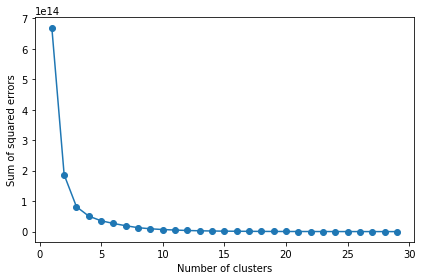

In [30]:
##choose the optimal number of clusters k for k-means++ clustering using the Elbow - method

sse = []  #sum of squared errors/distorsion
for i in range(1, 30):  
    km = KMeans(n_clusters=i, 
                init='k-means++', 
                n_init=30, 
                max_iter=300, 
                random_state=0)
    km.fit(df_array)
    sse.append(km.inertia_)
plt.plot(range(1, 30), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.tight_layout()
plt.show()

We choose k=3

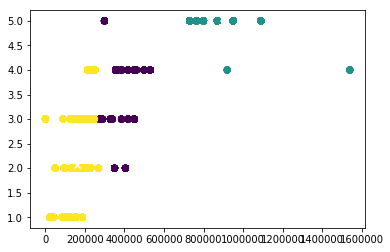

In [32]:
# we choose k=see the elbow

kmeans = KMeans(n_clusters=3, random_state=0).fit(df_array)
labels = kmeans.predict(df_array) #getting the cluster labels
#kmeans.labels_
centroids = kmeans.cluster_centers_   #centroid values
plt.scatter(df_array[:,0],df_array[:,1], c=kmeans.labels_)
plt.scatter(kmeans.cluster_centers_[:,0], 
            kmeans.cluster_centers_[:,1], 
            c='w', marker='x', linewidths=2)



**Clustering on the 2nd matrix**

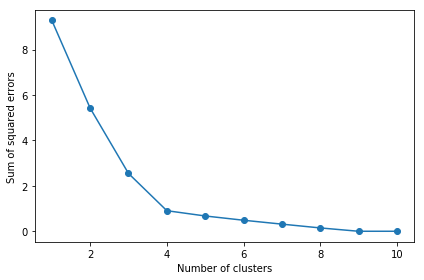

In [41]:
#choose of k
sse1 = []  #sum of squared errors/distorsion
for i in range(1, 11):  #decidere bene valori range
    km = KMeans(n_clusters=i, 
                init='k-means++', 
                n_init=11, 
                max_iter=300, 
                random_state=0)
    km.fit(X)
    sse1.append(km.inertia_)
plt.plot(range(1, 11), sse1, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.tight_layout()
#plt.savefig('./figures/elbow.png', dpi=300)
plt.show()

Now, we choose k=4

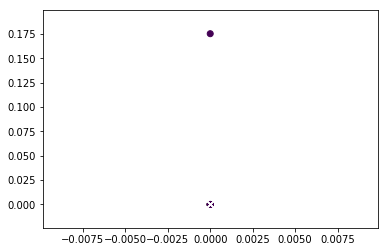

In [42]:
# we choose k=see the elbow

kmeans2 = KMeans(n_clusters=4, random_state=0).fit(X)
labels = kmeans2.predict(X) #getting the cluster labels
#kmeans.labels_
centroids = kmeans2.cluster_centers_   #centroid values
plt.scatter(X[:,0],X[:,1], c=kmeans2.labels_)
plt.scatter(kmeans2.cluster_centers_[:,0], 
            kmeans2.cluster_centers_[:,1], 
            c='w', marker='x', linewidths=2)


**Comparison among cluster**

We expect that both datasets will lead to similar clusters. Is this true?

**Find similar clusters - Jaccard-Similarity**



In [63]:
#Jaccard index [0,1]
def jaccard_sim(str1, str2): 
    a = set(str1) 
    b = set(str2)
    return len(a.intersection(b))/len(b.union(a))

In [69]:
sim=jaccard_sim(kmeans.labels_,kmeans2.labels_)
sim

0.75

In [85]:
#Jaccard distance, measure of dissimilarity between clusters
1-sim

0.25

At a first analysis, it doesn't seem that both datasets lead to similar clusters.

**Word cloud of house descriptions**

In [67]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

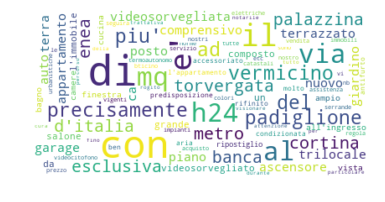

In [81]:
text = str(descriptions[0]) 

# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")

# Display the generated image:
plt.axis("off")
plt.show()

In [84]:
# Save the image in the img folder:
wordcloud.to_file("first_description.png")